GEREKLİ KÜTÜPHANELERİN IMPORT EDİLMESİ

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
import numpy as np
from kymatio import Scattering2D
from skimage import measure
import importlib
import utils
importlib.reload(utils)
from utils import *

# Kütüphane versiyon kontrolü
print("Kütüphaneler başarıyla yüklendi.")


Kütüphaneler başarıyla yüklendi.


1 ADET EĞİTİM GÖRSELİ VE LABELİN DAHA ÖNCEDEN BELİRLENMİŞ EN İYİ PIPELINE İLE ÖN İŞLENMESİ VE KAYDEDİLMESİ
(L1 Norm + Ortalama (Mean) + Parlaklık(20) + Keskinleştirme)

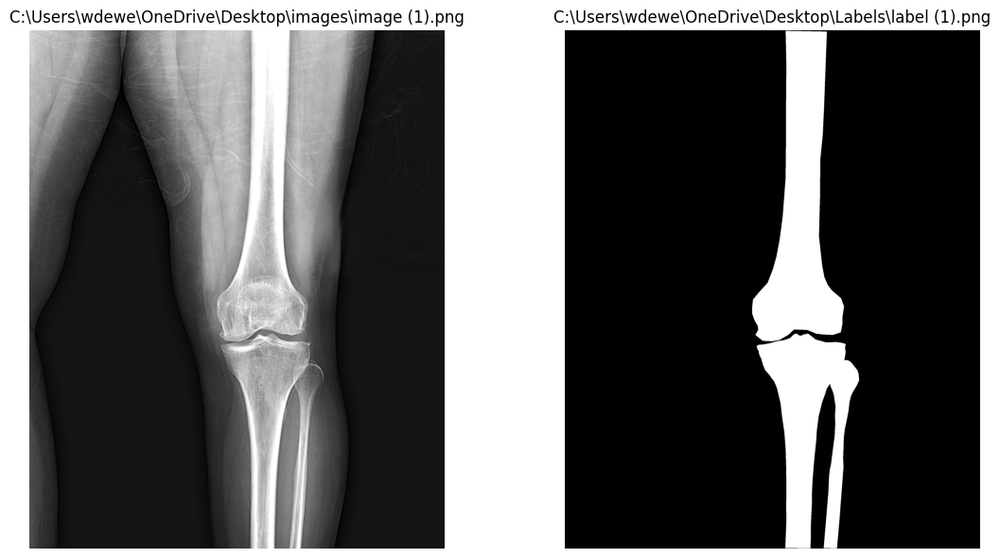

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def ConvertAndNormalize(img, apply_preprocessing=True):
    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(img.shape) == 3 and img.shape[2] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # I1 Norm Normalizasyonu
    normalized_image = img / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    normalized_image = (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir
    
    # Ön işleme işlemleri
    if apply_preprocessing:
        # Ortalama (Mean) Filtreleme
        def mean_filter(image, kernel_size=5):
            return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

        mean_filtered = mean_filter(normalized_image, kernel_size=5)

        # Parlaklık Artırma
        brightness_increase = 20  # Parlaklık artırma miktarı
        brightened_image = cv2.add(mean_filtered, np.full_like(mean_filtered, brightness_increase))

        # Keskinleştirme (Unsharp Masking)
        def sharpen_image(image):
            blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
            sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi
            return sharpened

        sharpened_image = sharpen_image(brightened_image)
    
    # Normalize edilmiş görüntü döndürülür
    return sharpened_image

def GetImageLabel(imgStr, labelStr, draw=False):
    img = cv2.imread(imgStr, cv2.IMREAD_GRAYSCALE); img = ConvertAndNormalize(img)
    label = cv2.imread(labelStr, cv2.IMREAD_GRAYSCALE)        
    if draw:
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(imgStr)
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(label, cmap='gray')
        plt.title(labelStr)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()  
    return img, label

# img ve label gorselleri al
img, label = GetImageLabel(
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (1).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (1).png",
    draw=True
)


YAZDIRMA FONKSİYONU

In [4]:
def Drawing(img, EdgePoints=None, EdgeLines=None, EdgePatchs=None, title=None, circle_radius = 10):
    output_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)    
       
    if EdgePoints is not None:         
        for point in EdgePoints:
            x, y = int(point[1]), int(point[0])  # x ve y koordinatları ters çevrilir
            cv2.circle(output_img, (x, y), circle_radius, (0, 0, 255), -1)  # Kırmızı daire   

    if EdgeLines is not None: 
        for Line in EdgeLines:
            start_point = Line["StartPointYX"]
            stop_point = Line["StopPointYX"]
            cv2.line(output_img, start_point[::-1], stop_point[::-1], color = (255, 255, 0) , thickness = 2)                                

    if EdgePatchs is not None: 
        # Img uzerine Patch ciz
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 1
        color = (255, 0, 0)  
        thickness = 2
        for k, (x,y,PatchSize,angle) in enumerate(EdgePatchs):
            rect = cv2.boxPoints(((float(x), float(y)), (PatchSize, PatchSize), angle))
            rect = np.int0(rect)            
            cv2.drawContours(output_img, [rect], 0, (0, 0, 255), 2)  

            # Draw a line indicating the angle
            end_x = int(x + (PatchSize / 2) * np.cos(np.radians(angle)))
            end_y = int(y + (PatchSize / 2) * np.sin(np.radians(angle)))
            cv2.line(output_img, (x, y), (end_x, end_y), (0, 0, 255), 2)  
            cv2.putText(output_img, str(k), (x, y - 10), font, font_scale, color, thickness, cv2.LINE_AA)    

    # Görüntü boyutlarına göre figsize hesaplama
    height, width = img.shape[:2]
    aspect_ratio = width / height
    figsize = (15 * aspect_ratio, 15)  # Oranı koruyarak uygun bir ölçekleme

    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    if title is not None:
        plt.title(title, fontsize=30)
    plt.axis('off')
    plt.show()  

LABEL VE BOUNDARY KULLANARAK KENAR NOKTALARINI BULMA

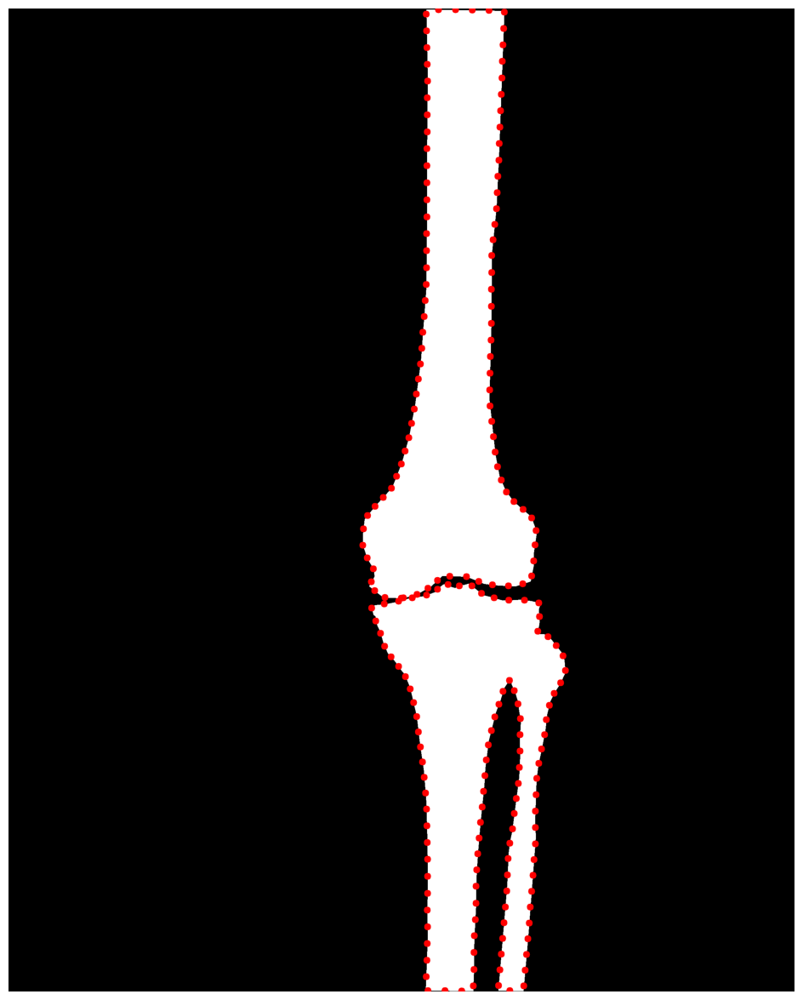

In [5]:
def GetLabelEdgePoints(img, sparsity_factor=1, circle_radius = 10, draw=False):
    contours = measure.find_contours(img, level=0.5)
    # Tüm sınır piksellerini birleştir
    boundary_points = np.vstack(contours)
    
    # Sparsity factor ile seyrekleştirme
    if sparsity_factor > 1:
        boundary_points = boundary_points[::sparsity_factor]
        
    if draw:
        Drawing(img, EdgePoints=boundary_points, circle_radius=circle_radius)

    return boundary_points.astype(int)

# Kenar Gorsellerini Kodla
img_EdgePoints = GetLabelEdgePoints(label, sparsity_factor=50, circle_radius=10, draw=True)   # EdgePoints --> [p,2] --> (y,x)

BOUNDARY İLE BULUNAN NOKTALARDAN PATCHLER ALMA

C:\Users\wdewe\AppData\Local\Temp\ipykernel_12560\2609303510.py:23: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


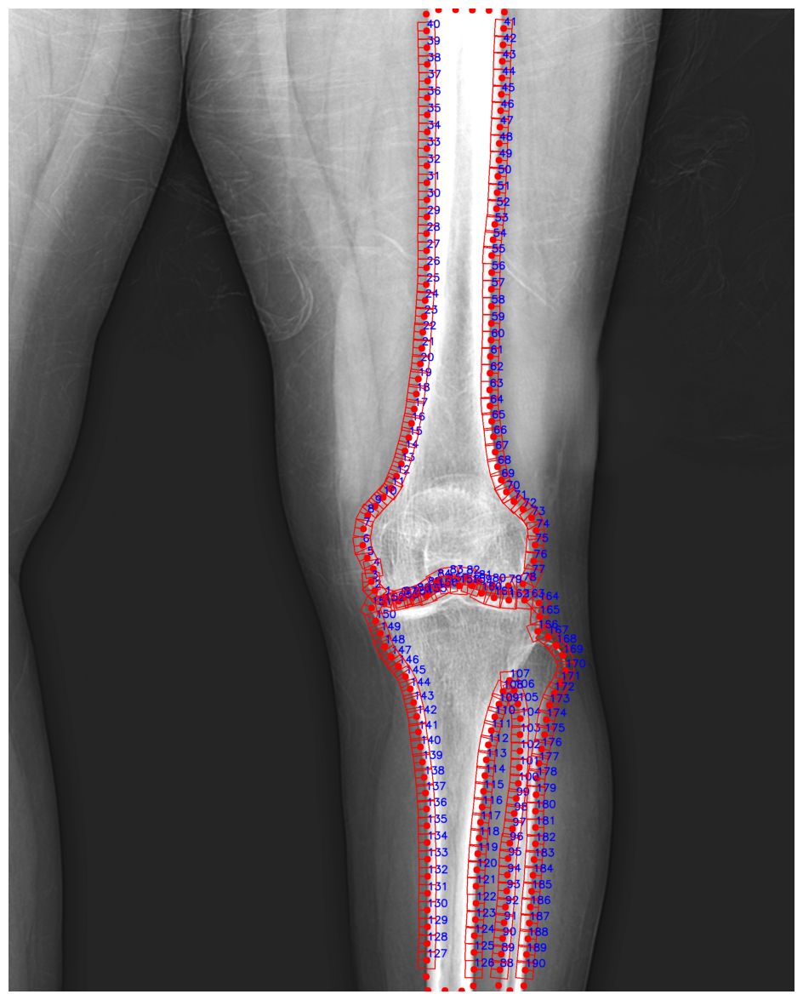

In [6]:
def GetEdgePatchs(img, EdgePoints, PatchSize=11, draw=True):
    EdgePatchs = []
    EdgePatchsInfo = []
    for i in range(len(EdgePoints)):
        # Çizginin başlangıç noktası
        y, x = EdgePoints[i]

        # Çizginin yönü
        prev_idx = (i - 1) % len(EdgePoints)
        next_idx = (i + 1) % len(EdgePoints)
        y1, x1 = EdgePoints[prev_idx]
        y2, x2 = EdgePoints[next_idx]
        dx = x2 - x1
        dy = y2 - y1
        if dx == 0 and dy == 0:
            continue  
        angle = math.atan2(-dx, dy)

        # Patch al
        center = (float(x), float(y))
        rotation_matrix = cv2.getRotationMatrix2D(center, np.degrees(angle), scale=1.0)
        rows, cols = img.shape
        rotated_image = cv2.warpAffine(img, rotation_matrix, (cols, rows), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        # Patch sınırlarını kontrol et
        y_start, y_end = y - PatchSize, y + PatchSize + 1
        x_start, x_end = x - PatchSize, x + PatchSize + 1

        if y_start < 0 or y_end > rows or x_start < 0 or x_end > cols:
            # Patch görüntü sınırlarının dışında, atla
            continue
                
        EdgePatch = rotated_image[y-PatchSize:y+PatchSize+1, x-PatchSize:x+PatchSize+1]

        EdgePatchs.append(EdgePatch)
        EdgePatchsInfo.append([x,y,PatchSize,np.degrees(angle)])
    
    if draw:
        Drawing(img, EdgePoints=EdgePoints, EdgePatchs = EdgePatchsInfo)        
        
    return EdgePatchs, EdgePatchsInfo

# img_EdgePoints --> img_EdgePatchs 
img_EdgePatchs, img_EdgePatchsInfo = GetEdgePatchs(img, img_EdgePoints, PatchSize=50, draw=True)  # M = 2*PatchSize + 1,  MxM = 101x101

PATCHLERİ GÖRSELLEŞTİRME

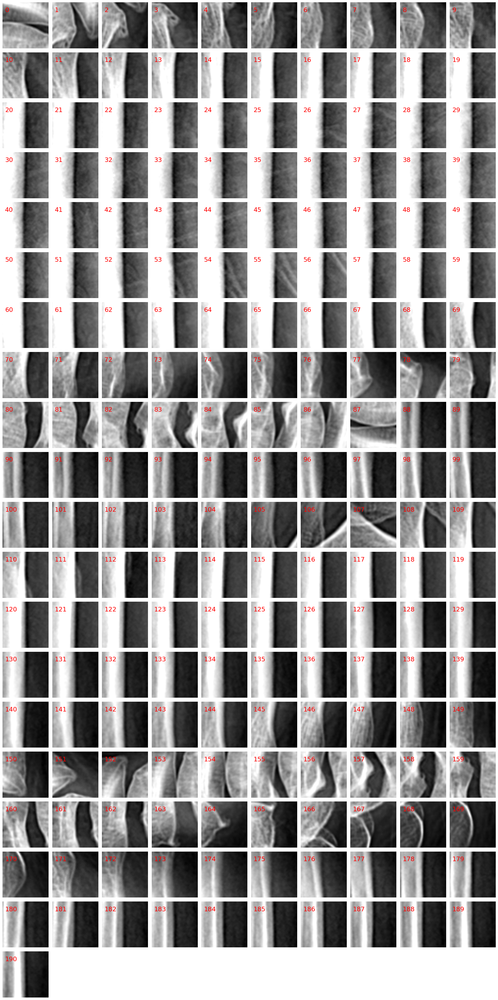

In [7]:
def DisplayPatches(EdgePatchs, max_cols=10):
    # Toplam patch sayısı
    num_patches = len(EdgePatchs)
    
    # Sütun sayısı (max_cols ile sınırlı)
    cols = min(max_cols, num_patches)
    
    # Satır sayısını hesapla
    rows = math.ceil(num_patches / cols)
    
    # Şekil oluşturma
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    axes = np.array(axes).reshape(-1)  # Tek boyutlu diziye dönüştür
    
    for i, ax in enumerate(axes):
        if i < num_patches:
            ax.imshow(EdgePatchs[i], cmap='gray')
            ax.text(5, 10, str(i), color='red', fontsize=18, ha='left', va='top')
            ax.axis('off')
        else:
            ax.axis('off')  # Fazla eksenleri kapat
    
    plt.tight_layout()
    plt.show()


# img_EdgePatchs gorsellerini tek figurede gor (donmusmuyu kontrol et)
DisplayPatches(img_EdgePatchs)

PATCHLERİ HOG İLE KODLAMA

In [21]:
import cv2
import numpy as np
import os
import math

# HOG özelliklerini hesaplayan fonksiyon
def compute_hog_features(image, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Verilen görüntü için HOG özelliklerini hesaplar.
    """
    hog = cv2.HOGDescriptor(
        _winSize=(image.shape[1] // cell_size[1] * cell_size[1], 
                  image.shape[0] // cell_size[0] * cell_size[0]),
        _blockSize=(block_size[1] * cell_size[1], block_size[0] * cell_size[0]),
        _blockStride=(cell_size[1], cell_size[0]),
        _cellSize=(cell_size[1], cell_size[0]),
        _nbins=nbins
    )
    features = hog.compute(image)
    return features.flatten()

# HOG özelliklerini ve koordinatlarını kaydeden fonksiyon
def save_hog_features_with_coords(patches, patch_info, output_path, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Patch'lerin HOG özelliklerini ve koordinatlarını HDD'ye kaydeder.
    """
    all_features = []
    all_coords = []

    for i, (patch, info) in enumerate(zip(patches, patch_info)):
        features = compute_hog_features(patch, cell_size, block_size, nbins)
        all_features.append(features)
        all_coords.append(info)

    all_features = np.array(all_features)
    all_coords = np.array(all_coords)

    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    np.savez(output_path, features=all_features, coords=all_coords)
    print(f"HOG özellikleri ve koordinatlar kaydedildi: {output_path}")



# Görüntüyü ve kenar noktalarını al (örneğin, img_EdgePoints burada)
img = cv2.imread(r"C:\Users\wdewe\OneDrive\Desktop\images\image (1).png", cv2.IMREAD_GRAYSCALE)



# HOG özelliklerini kaydetme
output_file_with_coords = r"C:\Users\wdewe\OneDrive\Desktop\hog_features_with_coords1.npz"
save_hog_features_with_coords(img_EdgePatchs, img_EdgePatchsInfo, output_file_with_coords)

# Sonuç olarak toplam kaç patch kodlandığını yazdır
print(f"Toplam {len(img_EdgePatchs)} patch HOG ile kodlandı.")


HOG özellikleri ve koordinatlar kaydedildi: C:\Users\wdewe\OneDrive\Desktop\hog_features_with_coords1.npz
Toplam 191 patch HOG ile kodlandı.


TEST AŞAMASI

TEST GÖRSELİNİN VE ETİKETİNİN SEÇİLMESİ

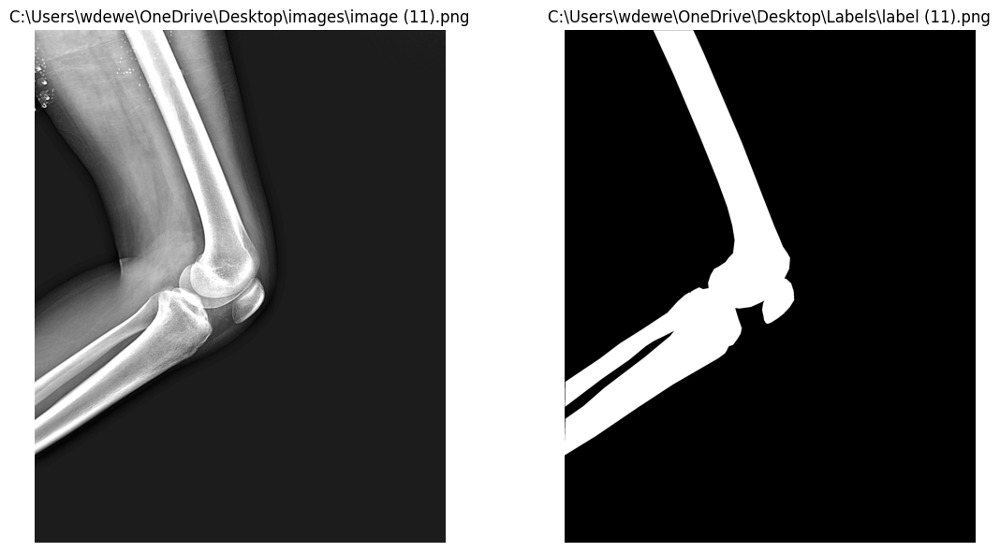

In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def ConvertAndNormalize(img, apply_preprocessing=True):
    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(img.shape) == 3 and img.shape[2] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # I1 Norm Normalizasyonu
    normalized_image = img / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    normalized_image = (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir
    
    # Ön işleme işlemleri
    if apply_preprocessing:
        # Ortalama (Mean) Filtreleme
        def mean_filter(image, kernel_size=5):
            return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

        mean_filtered = mean_filter(normalized_image, kernel_size=5)

        # Parlaklık Artırma
        brightness_increase = 20  # Parlaklık artırma miktarı
        brightened_image = cv2.add(mean_filtered, np.full_like(mean_filtered, brightness_increase))

        # Keskinleştirme (Unsharp Masking)
        def sharpen_image(image):
            blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
            sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi
            return sharpened

        sharpened_image = sharpen_image(brightened_image)
    
    # Normalize edilmiş görüntü döndürülür
    return sharpened_image

def GetImageLabel(imgStr, labelStr, draw=False):
    img = cv2.imread(imgStr, cv2.IMREAD_GRAYSCALE); img = ConvertAndNormalize(img)
    label = cv2.imread(labelStr, cv2.IMREAD_GRAYSCALE)        
    if draw:
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(imgStr)
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(label, cmap='gray')
        plt.title(labelStr)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()  
    return img, label

# img ve label gorselleri al
test_img, test_label = GetImageLabel(
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (11).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (11).png",
    draw=True
)


CANNY ALGORİTMASI İLE KENAR NOKTALARI BULMA

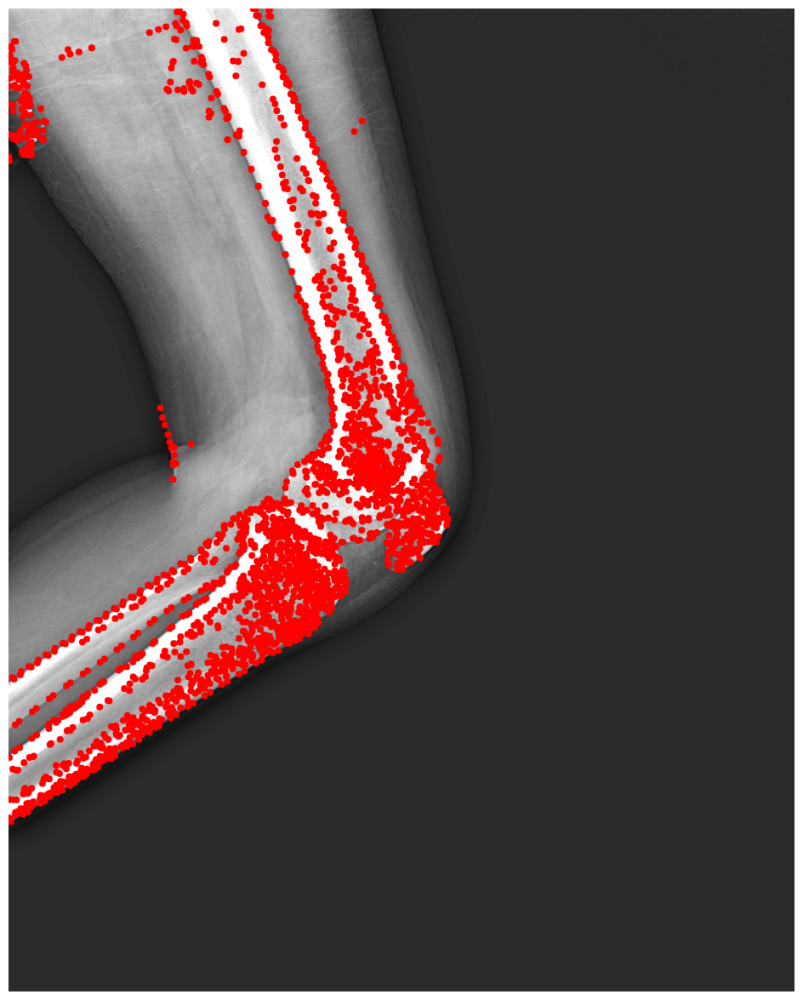

In [55]:
def GetCannyEdgePoints(img, sparsity_factor=1, draw=False):
    blurimg = cv2.GaussianBlur(img, (5, 5), 0)
    edges = cv2.Canny(blurimg, 25, 75)
    CannyEdgePoints, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    
    EdgePoints = []
    for ObjPoints in CannyEdgePoints:
        EdgePoints = EdgePoints + [(point[0][1], point[0][0]) for i, point in enumerate(ObjPoints) if i % sparsity_factor == 0]

    if draw:
        Drawing(img, EdgePoints=EdgePoints)

    return EdgePoints

test_img_EdgePoints = GetCannyEdgePoints(test_img, sparsity_factor=50, draw=True)   # EdgePoints --> [p,2] --> (y,x)

BULUNAN NOKTALARDAN PATCHLER ALMA

C:\Users\wdewe\AppData\Local\Temp\ipykernel_12560\2609303510.py:23: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)


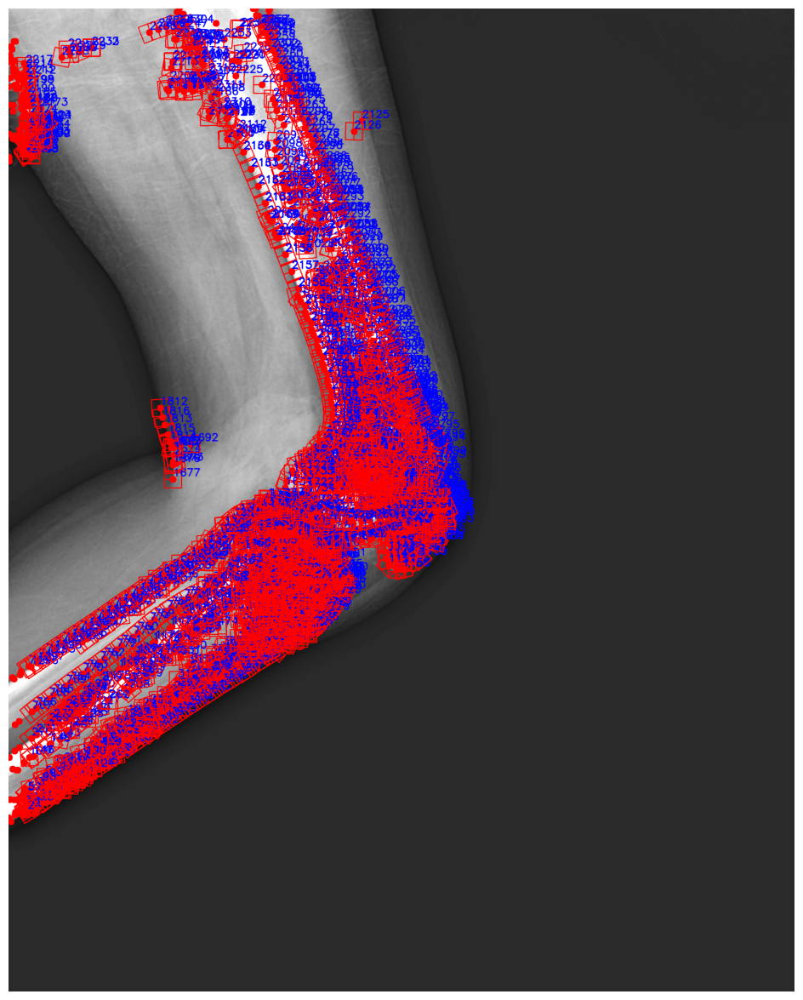

In [56]:
def GetEdgePatchs(img, EdgePoints, PatchSize=11, draw=True):
    EdgePatchs = []
    EdgePatchsInfo = []
    for i in range(len(EdgePoints)):
        # Çizginin başlangıç noktası
        y, x = EdgePoints[i]

        # Çizginin yönü
        prev_idx = (i - 1) % len(EdgePoints)
        next_idx = (i + 1) % len(EdgePoints)
        y1, x1 = EdgePoints[prev_idx]
        y2, x2 = EdgePoints[next_idx]
        dx = x2 - x1
        dy = y2 - y1
        if dx == 0 and dy == 0:
            continue  
        angle = math.atan2(-dx, dy)

        # Patch al
        center = (float(x), float(y))
        rotation_matrix = cv2.getRotationMatrix2D(center, np.degrees(angle), scale=1.0)
        rows, cols = img.shape
        rotated_image = cv2.warpAffine(img, rotation_matrix, (cols, rows), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        # Patch sınırlarını kontrol et
        y_start, y_end = y - PatchSize, y + PatchSize + 1
        x_start, x_end = x - PatchSize, x + PatchSize + 1

        if y_start < 0 or y_end > rows or x_start < 0 or x_end > cols:
            # Patch görüntü sınırlarının dışında, atla
            continue
                
        EdgePatch = rotated_image[y-PatchSize:y+PatchSize+1, x-PatchSize:x+PatchSize+1]

        EdgePatchs.append(EdgePatch)
        EdgePatchsInfo.append([x,y,PatchSize,np.degrees(angle)])
    
    if draw:
        Drawing(img, EdgePoints=EdgePoints, EdgePatchs = EdgePatchsInfo)        
        
    return EdgePatchs, EdgePatchsInfo


test_img_EdgePatchs, test_img_EdgePatchsInfo = GetEdgePatchs(test_img, test_img_EdgePoints, PatchSize=50, draw=True)

ALDIĞIMIZ PATCHLERİ HOG İLE KODLAYIP KAYDETME

In [57]:
import cv2
import numpy as np
import os
import math

# HOG özelliklerini hesaplayan fonksiyon
def compute_hog_features(image, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Verilen görüntü için HOG özelliklerini hesaplar.
    """
    hog = cv2.HOGDescriptor(
        _winSize=(image.shape[1] // cell_size[1] * cell_size[1], 
                  image.shape[0] // cell_size[0] * cell_size[0]),
        _blockSize=(block_size[1] * cell_size[1], block_size[0] * cell_size[0]),
        _blockStride=(cell_size[1], cell_size[0]),
        _cellSize=(cell_size[1], cell_size[0]),
        _nbins=nbins
    )
    features = hog.compute(image)
    return features.flatten()

# HOG özelliklerini ve koordinatlarını kaydeden fonksiyon
def save_hog_features_with_coords(patches, patch_info, output_path, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Patch'lerin HOG özelliklerini ve koordinatlarını HDD'ye kaydeder.
    """
    all_features = []
    all_coords = []

    for i, (patch, info) in enumerate(zip(patches, patch_info)):
        features = compute_hog_features(patch, cell_size, block_size, nbins)
        all_features.append(features)
        all_coords.append(info)

    all_features = np.array(all_features)
    all_coords = np.array(all_coords)

    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    np.savez(output_path, features=all_features, coords=all_coords)
    print(f"HOG özellikleri ve koordinatlar kaydedildi: {output_path}")

# Görüntüyü ve kenar noktalarını al (örneğin, img_EdgePoints burada)
img = cv2.imread(r"C:\Users\wdewe\OneDrive\Desktop\images\image (11).png", cv2.IMREAD_GRAYSCALE)

# HOG özelliklerini kaydetme
output_file_with_coords = r"C:\Users\wdewe\OneDrive\Desktop\test_image11_hog_features_with_coords.npz"
save_hog_features_with_coords(test_img_EdgePatchs, test_img_EdgePatchsInfo, output_file_with_coords)

# Sonuç olarak toplam kaç patch kodlandığını yazdır
print(f"Toplam {len(test_img_EdgePatchs)} patch HOG ile kodlandı.")


HOG özellikleri ve koordinatlar kaydedildi: C:\Users\wdewe\OneDrive\Desktop\test_image11_hog_features_with_coords.npz
Toplam 2315 patch HOG ile kodlandı.


10 ADET TESTİN ANAHTARLARINI SORGULAMA

In [59]:
import numpy as np
import os

# Dosya yolu
directory = r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3"
file_paths = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith('.npz')]

# 10 dosyanın anahtar değerlerini sorgulama
for idx, file_path in enumerate(file_paths[:10], start=1):
    hog_data = np.load(file_path)
    print(f"Dosya {idx}: {file_path}")
    print(hog_data.files)
    print("-" * 50)


Dosya 1: C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\hog_features_with_coords1.npz
['features', 'coords']
--------------------------------------------------
Dosya 2: C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image10_hog_features_with_coords.npz
['features', 'coords']
--------------------------------------------------
Dosya 3: C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image11_hog_features_with_coords.npz
['features', 'coords']
--------------------------------------------------
Dosya 4: C:\Users\wdewe\OneDrive\Belgeler\Dersler\Günce

HOG KODLARINI CROSS KOLERASYON İLE KARŞILAŞTIRMA, GÖRÜNTÜ-LABEL-TAHMİN(IOU)

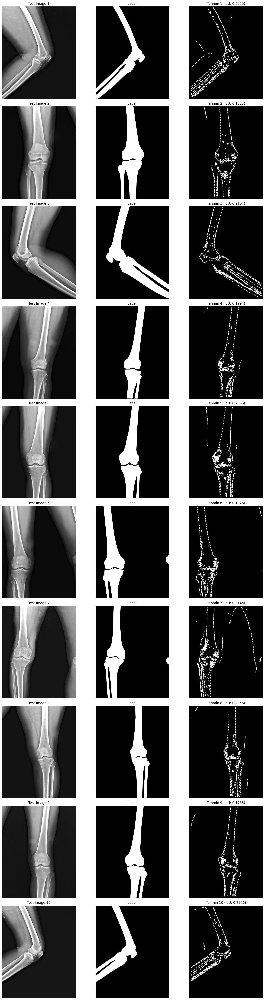

In [69]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

# Optimize edilmiş çapraz korelasyon fonksiyonu
def compute_cross_correlation_optimized(vectors1, vectors2):
    return 1 - cdist(vectors1, vectors2, metric='correlation')  # Korelasyon mesafesi

# HDD'deki referans HOG vektörlerini yükleme
stored_hog_vectors = np.load(r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\hog_features_with_coords1.npz")['features']

# İşlenecek test görüntüleri, etiketler ve HOG dosyalarının yolları
test_image_paths = [
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (2).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (3).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (4).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (5).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (6).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (7).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (8).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (9).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (10).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (11).png"
]

label_image_paths = [
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (2).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (3).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (4).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (5).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (6).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (7).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (8).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (9).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (10).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (11).png"
]

hog_files = [
    r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image2_hog_features_with_coords.npz",
    r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image3_hog_features_with_coords.npz",
    r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image4_hog_features_with_coords.npz",
    r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image5_hog_features_with_coords.npz",
    r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image6_hog_features_with_coords.npz",
    r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image7_hog_features_with_coords.npz",
    r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image8_hog_features_with_coords.npz",
    r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image9_hog_features_with_coords.npz",
    r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image10_hog_features_with_coords.npz",
    r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)\Modelleme 4_3\test_image11_hog_features_with_coords.npz"
]

# Görüntü işleme ve korelasyon hesaplama
plt.figure(figsize=(15, len(test_image_paths) * 5))
output_images = []  # Sonuç görsellerini tutmak için bir liste oluştur
for idx, (test_image_path, label_image_path, hog_file) in enumerate(zip(test_image_paths, label_image_paths, hog_files)):
    # Test HOG vektörlerini ve koordinatlarını yükleme
    hog_data = np.load(hog_file)
    test_hog_vectors = hog_data['features']
    test_coords = hog_data['coords']
    
    # Test görüntüsünü yükleme
    test_image = cv2.imread(test_image_path)
    output_img = np.zeros_like(test_image)  # Siyah bir görüntü oluşturma
    
    # Etiket görüntüsünü yükleme
    label_image = cv2.imread(label_image_path)

    # Çapraz korelasyonu hızlı hesaplama
    correlations_matrix = compute_cross_correlation_optimized(test_hog_vectors, stored_hog_vectors)
    threshold = 0.30
    high_correlation_indices = np.argwhere(correlations_matrix >= threshold)

    # Yüksek korelasyon eşleşmelerini işleme
    matching_coords_count = 0
    for test_idx, stored_idx in high_correlation_indices:
        coord = test_coords[test_idx]
        x, y = int(coord[0]), int(coord[1])
        cv2.circle(output_img, (x, y), 12, (255, 255, 255), -1)
        matching_coords_count += 1
    
    # Görüntü adını dosya yolundan çıkarma
    image_name = test_image_path.split("\\")[-1]
    
    # IoU hesaplama
    label_gray = cv2.cvtColor(label_image, cv2.COLOR_BGR2GRAY)
    ret, label_mask = cv2.threshold(label_gray, 127, 255, cv2.THRESH_BINARY)
    
    # label_maski gri tonlamadan üç kanala dönüştürme
    label_mask_three_channels = cv2.merge((label_mask, label_mask, label_mask))
    
    intersection = np.logical_and(output_img, label_mask_three_channels)
    union = np.logical_or(output_img, label_mask_three_channels)
    iou = np.sum(intersection) / np.sum(union)
    
    # Sonuç görselini output_images listesine ekleme
    output_images.append(output_img)
    
    # Orijinal görüntü, etiket ve çıktı görselleştirme
    plt.subplot(len(test_image_paths), 3, idx * 3 + 1)
    plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Test Image {idx+1}')
    plt.axis('off')
    
    plt.subplot(len(test_image_paths), 3, idx * 3 + 2)
    plt.imshow(cv2.cvtColor(label_image, cv2.COLOR_BGR2RGB))
    plt.title('Label ')
    plt.axis('off')
    
    plt.subplot(len(test_image_paths), 3, idx * 3 + 3)
    plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Tahmin {idx+1} (IoU: {iou:.4f})')
    plt.axis('off')

plt.tight_layout()
plt.show()


2. FARKLI MODELLEME AŞAMASI: TEK BİR HOG VEKTÖRÜ + CROSSKOLERASYON + IoU

KÜTÜPHANELERİ IMPORT EDİYORUZ

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
import numpy as np
from kymatio import Scattering2D
from skimage import measure

3 ADET EĞİTİM GÖRSELİ VE LABELLERİ ÖN İŞLEMDEN GEÇİRİLEREK GÖRSELLEŞTİRİLİYOR(I1 Norm +Ortalama (Mean) +Parlaklık +Keskinleştirme)

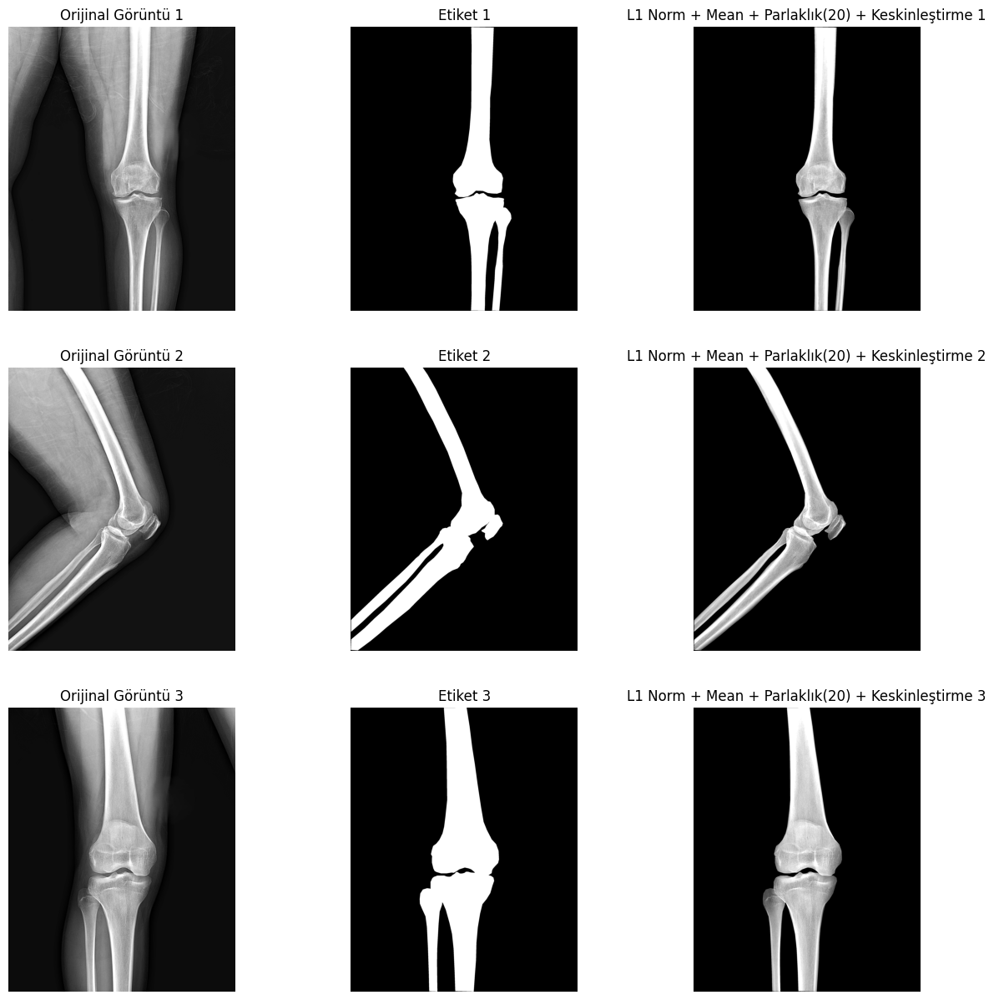

masked_image Boyutları: (2880, 2304)
masked_image2 Boyutları: (2880, 2304)
masked_image3 Boyutları: (2880, 2304)


In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Görüntü dosyalarının yolları
image_paths = [
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (1).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (2).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (3).png"
]

label_paths = [
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (1).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (2).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (3).png"
]

# Adım 1: I1 Norm Normalizasyonu
def normalize_image(image):
    normalized_image = image / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    return (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir

# Adım 2: Mean (Ortalama) Filtreleme
def mean_filter(image, kernel_size=5):
    return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

# Adım 3: Parlaklık Artırma
def increase_brightness(image, brightness_increase=20):
    return cv2.add(image, np.full_like(image, brightness_increase))

# Adım 4: Keskinleştirme (Unsharp Masking)
def sharpen_image(image):
    blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
    return cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi

# Etiketli bölgeyi çıkarma işlemi
def process_image(image_path, label_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    label_image = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)  # Etiket (tek kanallı)

    # Adım 1: Normalizasyon
    normalized_image = normalize_image(image)

    # Adım 2: Ortalama Filtreleme
    mean_filtered = mean_filter(normalized_image, kernel_size=5)

    # Adım 3: Parlaklık Artırma
    brightened_image = increase_brightness(mean_filtered, brightness_increase=20)

    # Adım 4: Keskinleştirme
    sharpened_image = sharpen_image(brightened_image)

    # Etiketli bölgeyi çıkarma (Aşındırma işlemi yok)
    masked_image = cv2.bitwise_and(sharpened_image, sharpened_image, mask=label_image)

    return image, label_image, masked_image

# Görselleri işleme
processed_images = [process_image(image_paths[i], label_paths[i]) for i in range(3)]

# masked_image'leri adlandırma
masked_image, masked_image2, masked_image3 = [masked for _, _, masked in processed_images]

# Sonuçları görselleştirme
plt.figure(figsize=(15, 15))

for i, (original, label, masked) in enumerate(processed_images):
    plt.subplot(3, 3, i*3+1)
    plt.title(f"Orijinal Görüntü {i+1}")
    plt.imshow(original, cmap="gray")
    plt.axis("off")

    plt.subplot(3, 3, i*3+2)
    plt.title(f"Etiket {i+1}")
    plt.imshow(label, cmap="gray")
    plt.axis("off")

    plt.subplot(3, 3, i*3+3)
    plt.title(f"L1 Norm + Mean + Parlaklık(20) + Keskinleştirme {i+1}")
    plt.imshow(masked, cmap="gray")
    plt.axis("off")

plt.show()

# masked_image'leri kullanabilirsiniz:
print(f"masked_image Boyutları: {masked_image.shape}")
print(f"masked_image2 Boyutları: {masked_image2.shape}")
print(f"masked_image3 Boyutları: {masked_image3.shape}")


YAZDIRMA FONKSİYONU

In [3]:
def Drawing(img, EdgePoints=None, EdgeLines=None, EdgePatchs=None, title=None, circle_radius=10):
    output_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)    
       
    if EdgePoints is not None:         
        for point in EdgePoints:
            x, y = int(point[1]), int(point[0])  # x ve y koordinatları ters çevrilir
            cv2.circle(output_img, (x, y), circle_radius, (0, 0, 255), -1)  # Kırmızı daire   

    if EdgeLines is not None: 
        for Line in EdgeLines:
            start_point = Line["StartPointYX"]
            stop_point = Line["StopPointYX"]
            cv2.line(output_img, start_point[::-1], stop_point[::-1], color=(255, 255, 0), thickness=2)                                

    if EdgePatchs is not None: 
        # Img üzerine Patch çiz
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 1
        color = (255, 0, 0)  
        thickness = 2
        for k, (x, y, PatchSize) in enumerate(EdgePatchs):  # (x, y, PatchSize) bekleniyor
            top_left = (x - PatchSize, y - PatchSize)
            bottom_right = (x + PatchSize, y + PatchSize)
            cv2.rectangle(output_img, top_left, bottom_right, (0, 0, 255), 2)
            cv2.putText(output_img, str(k), (x, y - 10), font, font_scale, color, thickness, cv2.LINE_AA)    

    # Görüntü boyutlarına göre figsize hesaplama
    height, width = img.shape[:2]
    aspect_ratio = width / height
    figsize = (15 * aspect_ratio, 15)  # Oranı koruyarak uygun bir ölçekleme

    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    if title is not None:
        plt.title(title, fontsize=30)
    plt.axis('off')
    plt.show()


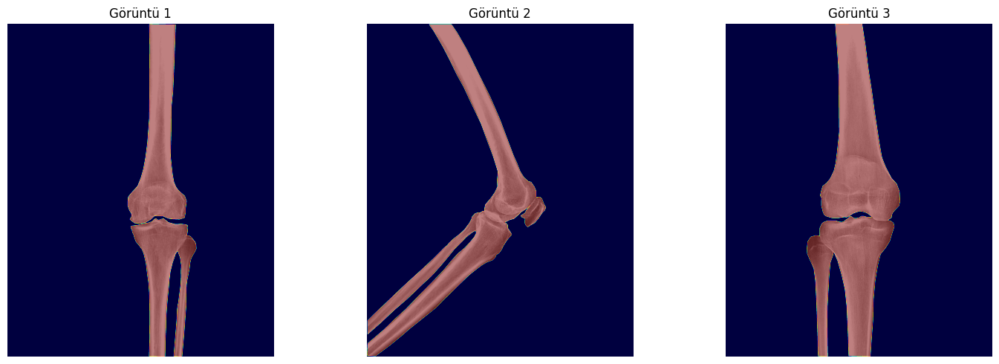

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Görüntülerin yolları
image_paths = [
    r"C:\Users\wdewe\OneDrive\Desktop\processed_image\processed_image.png",
    r"C:\Users\wdewe\OneDrive\Desktop\processed_image\processed_image2.png",
    r"C:\Users\wdewe\OneDrive\Desktop\processed_image\processed_image3.png"
]

plt.figure(figsize=(15, 5))  # 3 görsel için 1 sıra, 3 sütun

for idx, image_path in enumerate(image_paths):
    # Görüntüyü yükle ve gri tonlamaya çevir
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Siyah olmayan piksellerin maskesini oluştur
    non_zero_mask = image > 0
    
    # Görselleştirme
    plt.subplot(1, 3, idx + 1)  # idx+1 çünkü subplot indeksi 1'den başlar
    plt.title(f"Görüntü {idx + 1}")
    plt.imshow(image, cmap="gray")
    plt.imshow(non_zero_mask, cmap="jet", alpha=0.5)  # Maskeyi görselleştirme üzerine ekleme
    plt.axis("off")

plt.tight_layout()
plt.show()


Her bir pikselin tanjant açısına göre gradiyent ve oryantasyon toplamlarını tek bir vektörde topladık ve bu vektörleri bir dosyaya kaydettik. Ardından test görüntülerini de kodlayıp kaydedip bu vektörlerle korelasyon yapıp eşleştirdik. Eşleştirme sonuçları her bir test aşamasının sonunda bulunmaktadır.

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Sobel operatörleri ile gradyan hesaplama fonksiyonu
def compute_gradients(image):
    gx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # X yönü gradyanı
    gy = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Y yönü gradyanı

    # Gradyan büyüklüğü ve yönü
    magnitude = np.sqrt(gx**2 + gy**2)
    orientation = np.arctan2(gy, gx) * (180 / np.pi)
    orientation[orientation < 0] += 180  # 0-180 aralığına dönüştür

    return magnitude, orientation

# Her bir pikselin tanjant açısına göre gradyan ve oryantasyon toplamlarını bir vektörde toplama fonksiyonu
def compute_orientation_vectors(image, cell_size=8, bins=9):
    height, width = image.shape
    magnitude, orientation = compute_gradients(image)
    
    bin_width = 180 / bins
    hog_vector = np.zeros(bins, dtype=np.float32)  # HOG vektörü başlatma

    # Yalnızca siyah olmayan pikselleri filtreleme
    non_zero_mask = image > 0  # Siyah olmayan piksellerin maskesi

    # Oryantasyon histogramları toplama
    for y in range(0, height - cell_size + 1, cell_size):
        for x in range(0, width - cell_size + 1, cell_size):
            cell_magnitude = magnitude[y:y+cell_size, x:x+cell_size]
            cell_orientation = orientation[y:y+cell_size, x:x+cell_size]
            cell_mask = non_zero_mask[y:y+cell_size, x:x+cell_size]  # Maskeye göre filtreleme

            # Sadece siyah olmayan pikselleri kullanarak histogram hesaplama
            hist = np.zeros(bins, dtype=np.float32)
            for i in range(cell_size):
                for j in range(cell_size):
                    if cell_mask[i, j]:  # Siyah olmayan pikselleri kontrol et
                        angle = cell_orientation[i, j]
                        mag = cell_magnitude[i, j]
                        bin_idx = int(angle // bin_width)  # Hangi bin
                        bin_idx = bin_idx % bins  # Sınır kontrolü
                        hist[bin_idx] += mag  # Bine ekleme
            
            hog_vector += hist  # Histogramları birleştir
    
    return hog_vector

# Görüntü yolları
image_paths = [
    r"C:\Users\wdewe\OneDrive\Desktop\processed_image\processed_image.png",
    r"C:\Users\wdewe\OneDrive\Desktop\processed_image\processed_image2.png",
    r"C:\Users\wdewe\OneDrive\Desktop\processed_image\processed_image3.png"
]

# Tüm HOG vektörlerini saklamak için liste
all_hog_vectors = []

# Her görüntü için HOG vektörü hesapla
for i, image_path in enumerate(image_paths, start=1):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    hog_vector = compute_orientation_vectors(image)
    all_hog_vectors.append(hog_vector)

# Tüm HOG vektörlerini tek bir dosyada kaydet
combined_hog_vectors = np.array(all_hog_vectors)
np.savez("combined_hog_vectors.npz", vectors=combined_hog_vectors)

print("Tüm HOG vektörleri başarıyla tek bir dosyada kaydedildi.")

Tüm HOG vektörleri başarıyla tek bir dosyada kaydedildi.


#############

TEST AŞAMASI

TEST GÖRÜNTÜLERİNİ AL VE ÖNİŞLEMEDEN GEÇİR. (3 ADET TEST GÖRÜNTÜSÜ)
LABELLERİYLE BERABER GÖRSELLEŞTİR

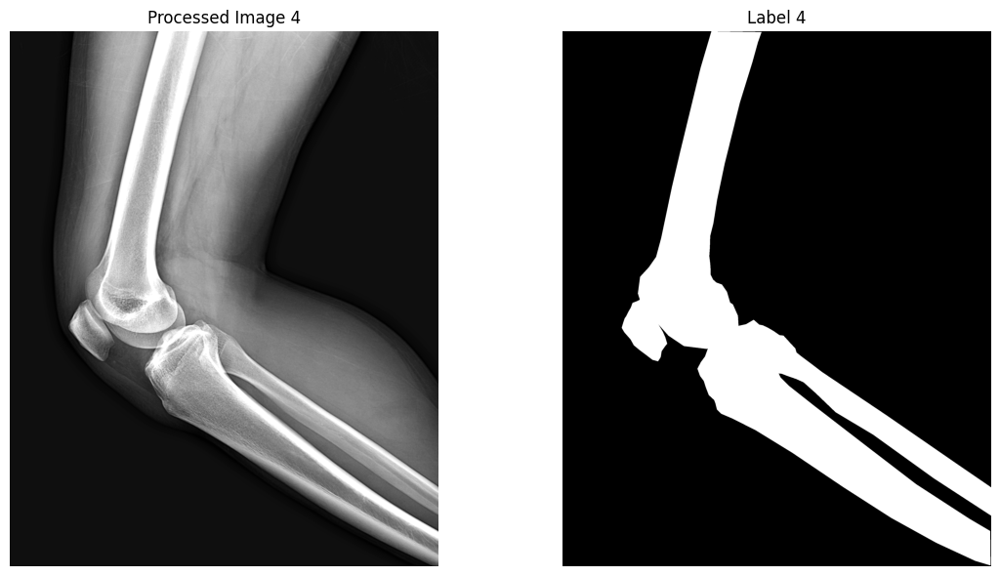

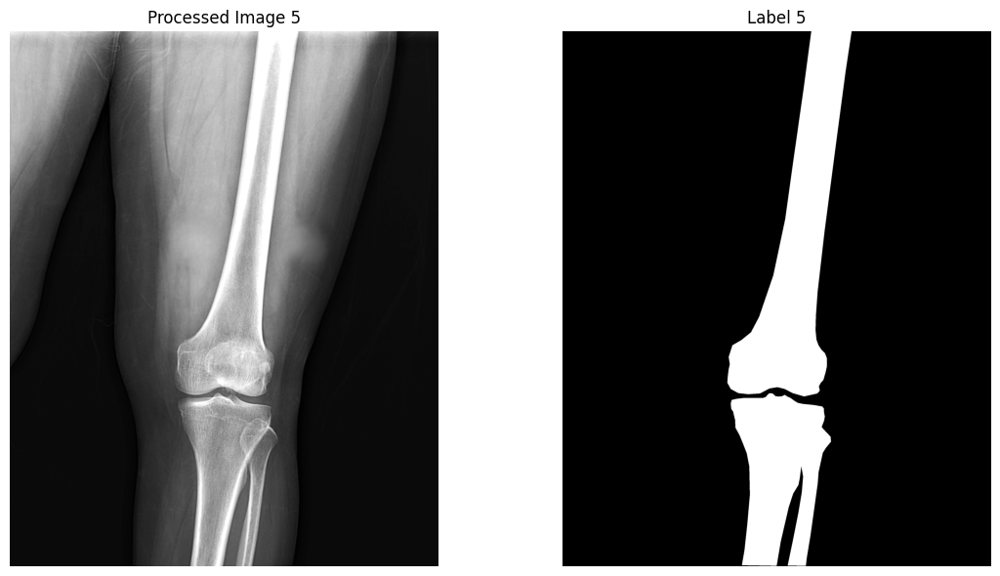

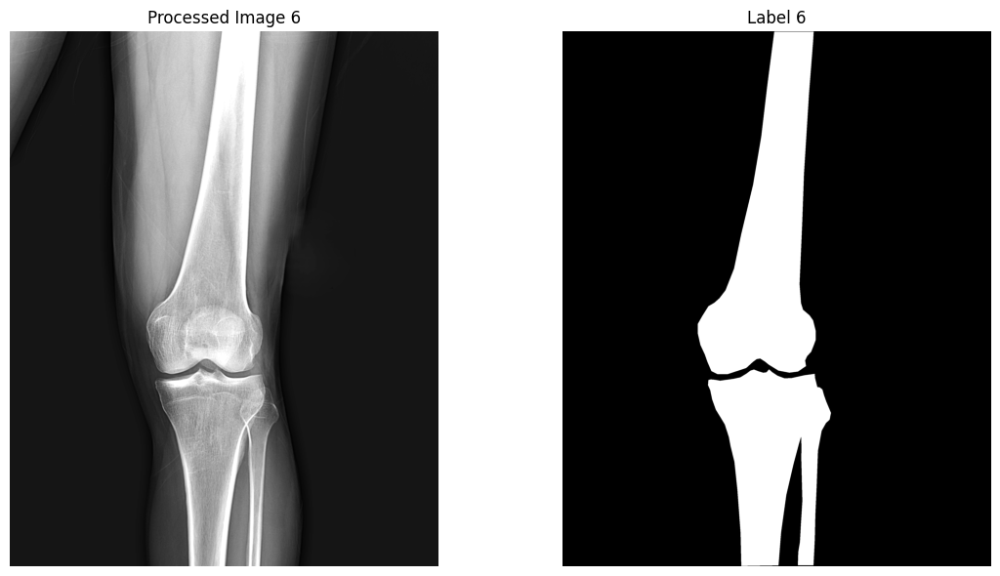

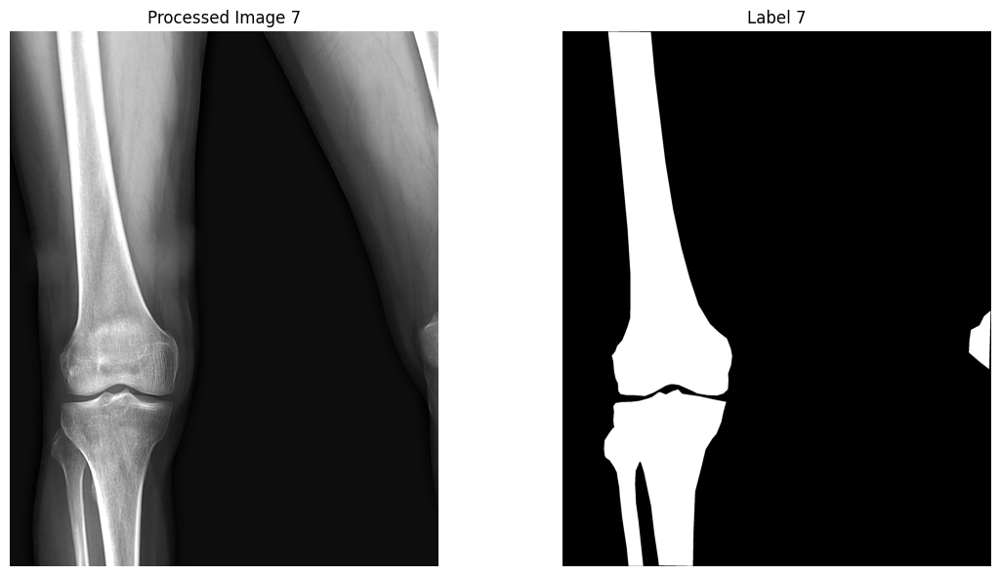

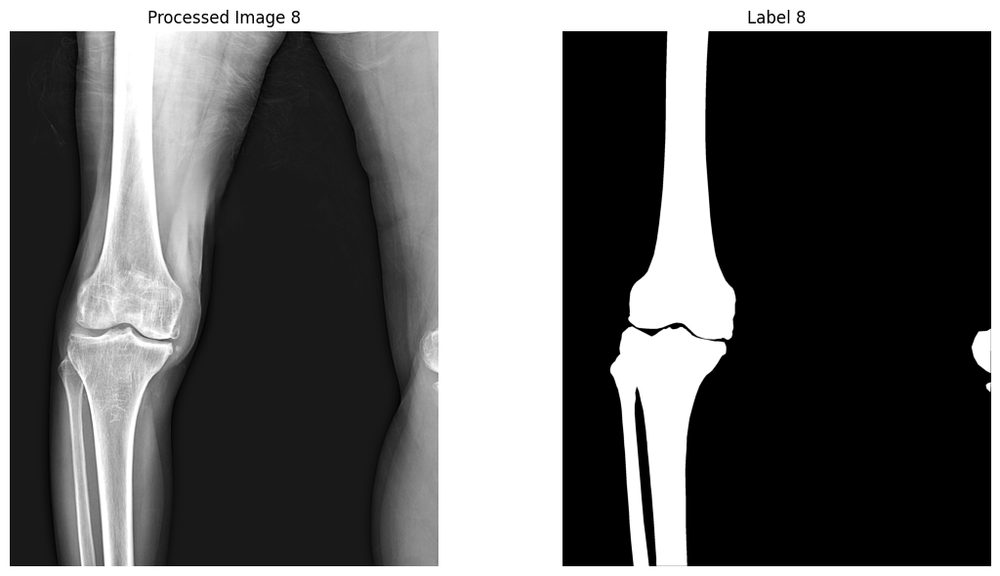

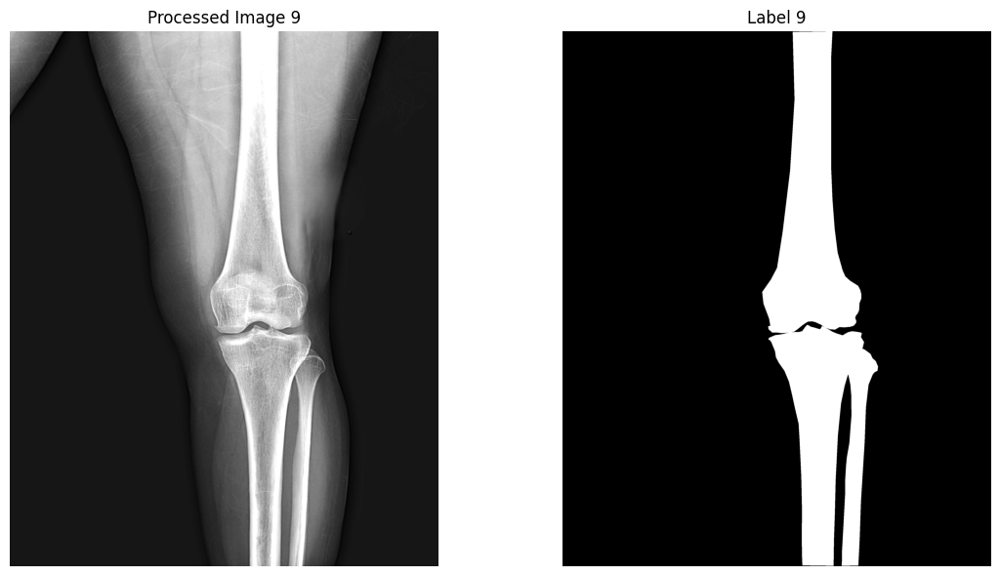

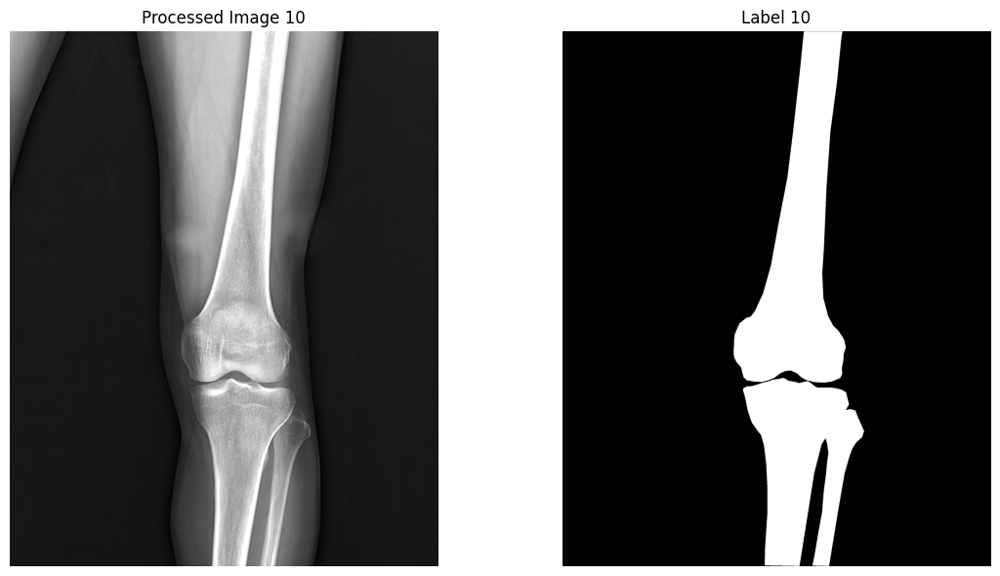

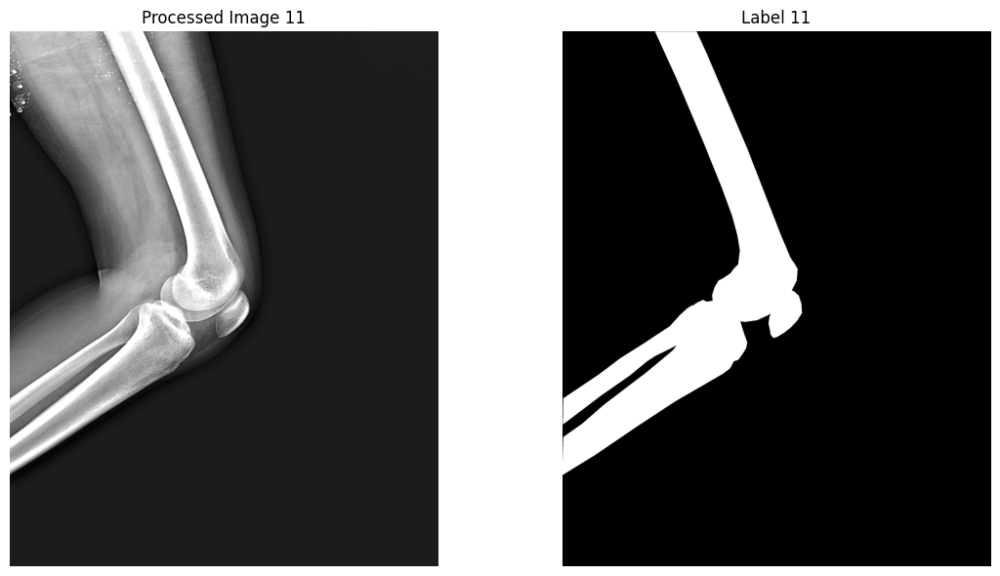

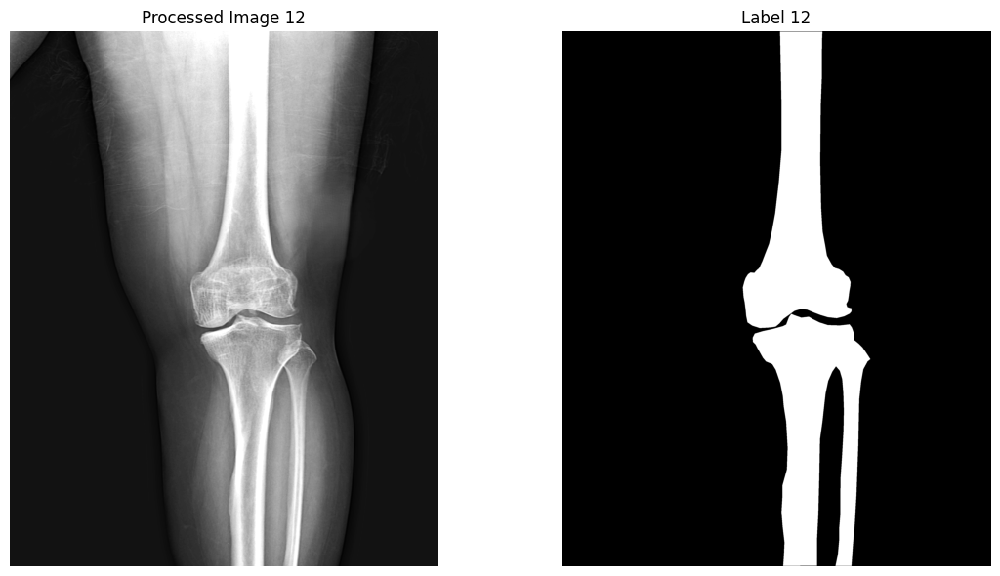

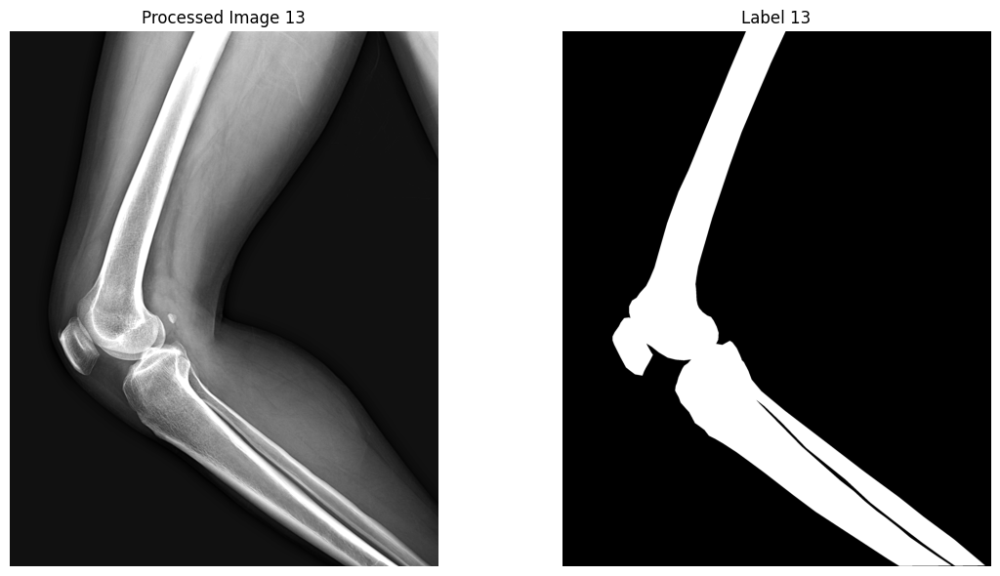

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Görüntü ve etiketleri yükleyen fonksiyon
def GetImageLabel(imgStr, labelStr, draw=False):
    img = cv2.imread(imgStr, cv2.IMREAD_GRAYSCALE)
    label = cv2.imread(labelStr, cv2.IMREAD_GRAYSCALE)        
    if draw:
        # Görüntü ve etiketleri yan yana çiz
        plt.figure(figsize=(12, 6))  # Şekil boyutunu ayarla
        plt.subplot(1, 2, 1)  # 1 satır, 2 sütun, ilk eksen
        plt.imshow(img, cmap='gray')  # img görüntüsünü göster
        plt.title(imgStr)  # Başlık
        plt.axis('off')  # Eksenleri kapat
        
        plt.subplot(1, 2, 2)  # 1 satır, 2 sütun, ikinci eksen
        plt.imshow(label, cmap='gray')  # label görüntüsünü göster
        plt.title(labelStr)  # Başlık
        plt.axis('off')  # Eksenleri kapat
        
        plt.tight_layout()
        plt.show()  # Şekli göster        
    return img, label

# Görüntü dosyalarının yolları
image_paths = [
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (4).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (5).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (6).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (7).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (8).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (9).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (10).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (11).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (12).png",
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (13).png"
    
]

label_paths = [
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (4).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (5).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (6).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (7).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (8).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (9).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (10).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (11).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (12).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (13).png"
    
    
]

# Adımlar
def process_image(image_path, label_path):
    # Görüntüyü ve etiketi yükle
    img, label = GetImageLabel(image_path, label_path, draw=False)

    # I1 Norm Normalizasyonu
    normalized_image = img / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    normalized_image = (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir

    # Ortalama (Mean) Filtreleme
    def mean_filter(image, kernel_size=5):
        return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

    mean_filtered = mean_filter(normalized_image, kernel_size=5)

    # Parlaklık Artırma
    brightness_increase = 20  # Parlaklık artırma miktarı
    brightened_image = cv2.add(mean_filtered, np.full_like(mean_filtered, brightness_increase))

    # Keskinleştirme (Unsharp Masking)
    def sharpen_image(image):
        blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
        sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi
        return sharpened

    sharpened_image = sharpen_image(brightened_image)

    return sharpened_image, label  # Hem işlenmiş görüntü hem de label döndürülüyor

# İşlenmiş görüntüleri ve etiketleri saklamak için listeler
sharpened_images = []
labels = []

# Görüntüleri işleme ve son hali yazdırma
for i, (image_path, label_path) in enumerate(zip(image_paths, label_paths)):
    sharpened_image, label = process_image(image_path, label_path)
    sharpened_images.append(sharpened_image)  # İşlenmiş görüntüyü listeye ekle
    labels.append(label)  # Etiketi listeye ekle

    # Görüntüleri ve etiketleri yan yana çiz
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(sharpened_image, cmap='gray')
    plt.title(f"Processed Image {i+4}")
    plt.axis('off')  # Eksenleri kapat
    
    plt.subplot(1, 2, 2)
    plt.imshow(label, cmap='gray')
    plt.title(f"Label {i+4}")
    plt.axis('off')  # Eksenleri kapat
    
    plt.tight_layout()
    plt.show()




DRAWING FONKSİYONU

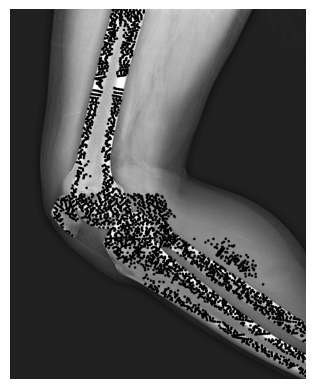

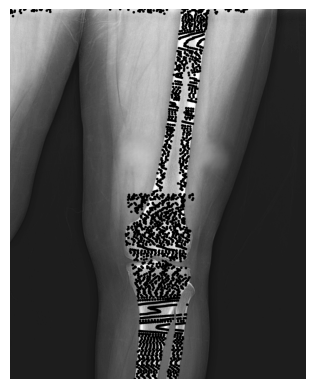

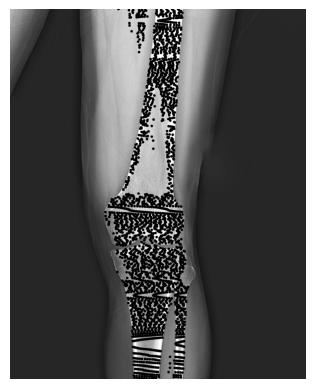

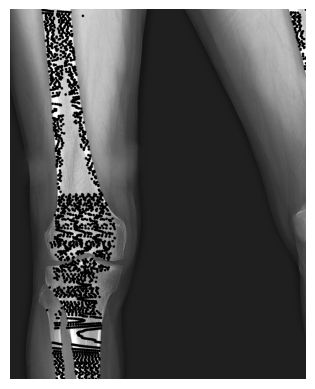

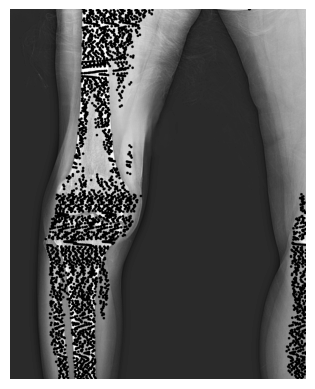

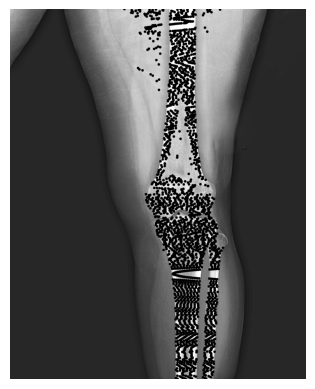

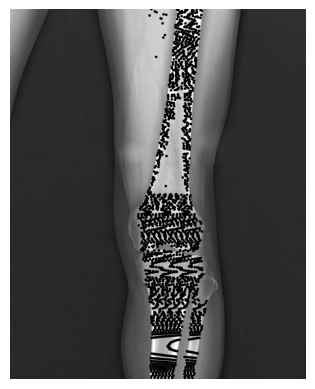

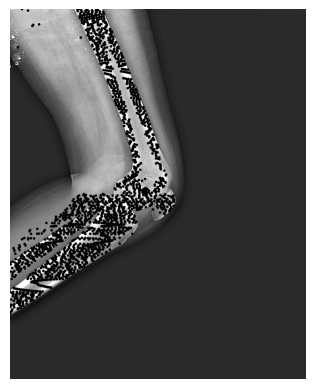

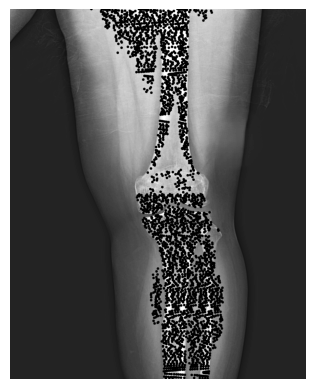

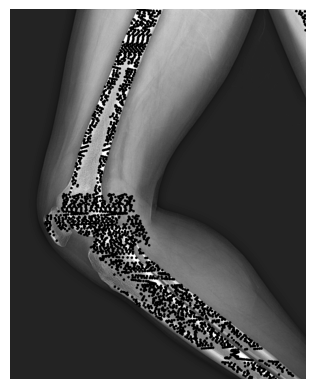

In [5]:

# Önceden tanımlı Drawing fonksiyonu
def Drawing(img, EdgePoints, circle_radius=10):
    """
    Görüntü üzerine belirtilen noktaları çizen fonksiyon
    """
    img_copy = img.copy()
    for point in EdgePoints:
        cv2.circle(img_copy, tuple(point[::-1]), circle_radius, (0, 0, 255), -1)  # Kırmızı nokta çizer
    plt.imshow(img_copy, cmap='gray')
    plt.axis('off')  # Eksenleri kapat
    plt.show()
    
def GetPatchsFromNonBlackPixels(img, NonBlackPixels, PatchSize=11, draw=True):
    """
    Siyah olmayan piksellerden yamalar alır.
    Args:
        img: Giriş görüntüsü (tek kanallı).
        NonBlackPixels: Siyah olmayan piksellerin (y, x) koordinatları.
        PatchSize: Yamaların boyutu (2 * PatchSize + 1, 2 * PatchSize + 1).
        draw: Yamaları görselleştirmek isteyip istemediğiniz.
    Returns:
        Patchs: Siyah olmayan piksellerden alınan yamalar.
        PatchsInfo: Yamaların konum ve boyut bilgileri.
    """
    Patchs = []
    PatchsInfo = []
    rows, cols = img.shape

    for y, x in NonBlackPixels:
        # Yamayı sınır kontrolü yaparak al
        y_start, y_end = int(y - PatchSize), int(y + PatchSize + 1)
        x_start, x_end = int(x - PatchSize), int(x + PatchSize + 1)

        if y_start < 0 or y_end > rows or x_start < 0 or x_end > cols:
            # Yama görüntü sınırlarının dışında, atla
            continue

        Patch = img[y_start:y_end, x_start:x_end]
        Patchs.append(Patch)
        PatchsInfo.append((x, y, PatchSize))

    if draw:
        Drawing(img, EdgePoints=NonBlackPixels, EdgePatchs=PatchsInfo)

    return Patchs, PatchsInfo

# Siyah olmayan pikselleri alan fonksiyon
def GetNonBlackPixels(img, sparsity_factor=1, draw=False, circle_radius=10):
    """
    Siyah olmayan pikselleri alır, görüntüyü yukarı ve aşağı bölgelere ayırarak farklı eşik değerleri uygular.
    Args:
        img: Giriş görüntüsü (tek kanallı).
        sparsity_factor: Piksel seyrekleştirme faktörü.
        draw: Piksel noktalarını çizmek isteyip istemediğiniz.
        circle_radius: Çizim sırasında noktaların yarıçapı.
    Returns:
        pixels: Siyah olmayan piksellerin (y, x) koordinatları.
    """
    # Görüntünün boyutlarını al
    height, width = img.shape

    # Görüntüyü yukarı ve aşağı olarak iki bölgeye ayır
    top_half = img[:height // 2, :]
    bottom_half = img[height // 2:, :]

    # Yukarı bölge için eşikleme
    y_top, x_top = np.where(top_half > 210)
    pixels_top = np.vstack((y_top, x_top)).T

    # Aşağı bölge için eşikleme
    y_bottom, x_bottom = np.where(bottom_half > 140)
    y_bottom += height // 2  # Aşağı bölgenin y koordinatını düzelt
    pixels_bottom = np.vstack((y_bottom, x_bottom)).T

    # Yukarı ve aşağı bölgelerin piksellerini birleştir
    pixels = np.vstack((pixels_top, pixels_bottom))

    # Sparsity factor ile seyrekleştirme
    if sparsity_factor > 1:
        pixels = pixels[::sparsity_factor]

    # Çizim yapmak istenirse
    if draw:
        Drawing(img, EdgePoints=pixels, circle_radius=circle_radius)

    return pixels

# Her bir işlenmiş görüntü için siyah olmayan pikselleri al ve çiz
for i, img in enumerate(sharpened_images, start=6):
    # Siyah olmayan pikselleri al
    test_img_Points = GetNonBlackPixels(img, sparsity_factor=300, circle_radius=10, draw=True)


In [6]:
# Patch almak için fonksiyonu her bir görüntüde uygulamak
patches_dict = {}  # Her bir görüntü için patch'leri saklayacak bir sözlük

# Görüntülerin listesi ve isimleri
# Burada işlenmiş görüntüleri kullanıyoruz
sharpened_images = sharpened_images  # İşlenmiş görüntüler
image_names = ['test_sharpened_image6', 'test_sharpened_image7', 'test_sharpened_image8']

# Her bir görüntüde siyah olmayan pikselleri al ve patch'leri al
for img, img_name in zip(sharpened_images, image_names):
    # Siyah olmayan pikselleri al
    non_black_pixels = GetNonBlackPixels(img, sparsity_factor=300, circle_radius=10, draw=False)  # Noktaları al

    # Patch'leri al
    patches, patch_info = GetPatchsFromNonBlackPixels(img, non_black_pixels, PatchSize=30, draw=False)
    
    # Görüntü ismi ile patch'leri sözlüğe ekle
    patches_dict[img_name] = {
        'patches': patches,
        'patch_info': patch_info
    }

# Her bir görüntünün patch'lerine erişmek için
for img_name, patch_data in patches_dict.items():
    print(f"{img_name} için toplam patch sayısı: {len(patch_data['patches'])}")


test_sharpened_image6 için toplam patch sayısı: 3084
test_sharpened_image7 için toplam patch sayısı: 2372
test_sharpened_image8 için toplam patch sayısı: 2814


TEST GÖRSELLERİNİ TEK BİR HOG VEKTÖRÜ OLARAK KODLAYIP KAYDETME

In [8]:
import cv2
import numpy as np
import os

# Sobel operatörleri ile gradyan hesaplama fonksiyonu
def compute_gradients(image):
    gx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # X yönü gradyanı
    gy = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Y yönü gradyanı

    # Gradyan büyüklüğü ve yönü
    magnitude = np.sqrt(gx**2 + gy**2)
    orientation = np.arctan2(gy, gx) * (180 / np.pi)
    orientation[orientation < 0] += 180  # 0-180 aralığına dönüştür

    return magnitude, orientation

# Her bir pikselin tanjant açısına göre gradyan ve oryantasyon toplamlarını bir vektörde toplama fonksiyonu
def compute_orientation_vectors(image, cell_size=8, bins=9):
    height, width = image.shape
    magnitude, orientation = compute_gradients(image)
    
    bin_width = 180 / bins
    hog_vector = np.zeros(bins, dtype=np.float32)  # HOG vektörü başlatma

    # Yalnızca siyah olmayan pikselleri filtreleme
    non_zero_mask = image > 0  # Siyah olmayan piksellerin maskesi

    # Oryantasyon histogramları toplama
    for y in range(0, height - cell_size + 1, cell_size):
        for x in range(0, width - cell_size + 1, cell_size):
            cell_magnitude = magnitude[y:y+cell_size, x:x+cell_size]
            cell_orientation = orientation[y:y+cell_size, x:x+cell_size]
            cell_mask = non_zero_mask[y:y+cell_size, x:x+cell_size]  # Maskeye göre filtreleme

            # Sadece siyah olmayan pikselleri kullanarak histogram hesaplama
            hist = np.zeros(bins, dtype=np.float32)
            for i in range(cell_size):
                for j in range(cell_size):
                    if cell_mask[i, j]:  # Siyah olmayan pikselleri kontrol et
                        angle = cell_orientation[i, j]
                        mag = cell_magnitude[i, j]
                        bin_idx = int(angle // bin_width)  # Hangi bin
                        bin_idx = bin_idx % bins  # Sınır kontrolü
                        hist[bin_idx] += mag  # Bine ekleme
            
            hog_vector += hist  # Histogramları birleştir
    
    return hog_vector

# Görüntü yolları
# Önceki önişlemeden gelen 10 test görselini kullan
image_paths = [
    sharpened_images[0],  # test_image4
    sharpened_images[1],  # test_image5
    sharpened_images[2],  # test_image6
    sharpened_images[3],  # test_image7
    sharpened_images[4],  # test_image8
    sharpened_images[5],  # test_image9
    sharpened_images[6],  # test_image10
    sharpened_images[7],  # test_image11
    sharpened_images[8],  # test_image12
    sharpened_images[9]   # test_image13
]

# Görüntüler için HOG vektörlerini hesapla ve ayrı ayrı kaydet
output_directory = r"C:\Users\wdewe\OneDrive\Desktop"

if not os.path.exists(output_directory):
    os.makedirs(output_directory)

for idx, image in enumerate(sharpened_images):
    # HOG vektörünü hesapla
    hog_vector = compute_orientation_vectors(image)

    # Çıktı dosya adı ve yolu
    output_file = os.path.join(output_directory, f"processed_image{idx+4}_hog_vector.npz")

    # Vektörü kaydet
    np.savez(output_file, vector=hog_vector)
    print(f"HOG vektörü kaydedildi: {output_file}")


HOG vektörü kaydedildi: C:\Users\wdewe\OneDrive\Desktop\processed_image4_hog_vector.npz
HOG vektörü kaydedildi: C:\Users\wdewe\OneDrive\Desktop\processed_image5_hog_vector.npz
HOG vektörü kaydedildi: C:\Users\wdewe\OneDrive\Desktop\processed_image6_hog_vector.npz
HOG vektörü kaydedildi: C:\Users\wdewe\OneDrive\Desktop\processed_image7_hog_vector.npz
HOG vektörü kaydedildi: C:\Users\wdewe\OneDrive\Desktop\processed_image8_hog_vector.npz
HOG vektörü kaydedildi: C:\Users\wdewe\OneDrive\Desktop\processed_image9_hog_vector.npz
HOG vektörü kaydedildi: C:\Users\wdewe\OneDrive\Desktop\processed_image10_hog_vector.npz
HOG vektörü kaydedildi: C:\Users\wdewe\OneDrive\Desktop\processed_image11_hog_vector.npz
HOG vektörü kaydedildi: C:\Users\wdewe\OneDrive\Desktop\processed_image12_hog_vector.npz
HOG vektörü kaydedildi: C:\Users\wdewe\OneDrive\Desktop\processed_image13_hog_vector.npz


HOD DOSYALARININ ANAHTAR KONTROLÜ

In [9]:
import os

# İşte dosyaları kontrol etmek için bir kod örneği:
hog_directory = r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Biyomedikal Mühendisliği\Modelleme Kodları (50 Puan)"

# HOG dosyalarının isimlerini al
hog_files = [f for f in os.listdir(hog_directory) if f.endswith('.npz')]

# Tüm HOG dosyalarının anahtarlarını kontrol et
for hog_file in hog_files:
    file_path = os.path.join(hog_directory, hog_file)
    try:
        hog_data = np.load(file_path)
        print(f"{hog_file} dosyasının anahtarları: {hog_data.files}")
    except Exception as e:
        print(f"{hog_file} dosyası okunamadı: {e}")


combined_hog_vectors.npz dosyasının anahtarları: ['vectors']
processed_image10_hog_vector.npz dosyasının anahtarları: ['vector']
processed_image11_hog_vector.npz dosyasının anahtarları: ['vector']
processed_image12_hog_vector.npz dosyasının anahtarları: ['vector']
processed_image13_hog_vector.npz dosyasının anahtarları: ['vector']
processed_image4_hog_vector.npz dosyasının anahtarları: ['vector']
processed_image5_hog_vector.npz dosyasının anahtarları: ['vector']
processed_image6_hog_vector.npz dosyasının anahtarları: ['vector']
processed_image7_hog_vector.npz dosyasının anahtarları: ['vector']
processed_image8_hog_vector.npz dosyasının anahtarları: ['vector']
processed_image9_hog_vector.npz dosyasının anahtarları: ['vector']


KORELASYON İLE KARŞILAŞTIRMA

Test görüntüsü 4 için korelasyon: -0.0872
Test görüntüsü 5 için korelasyon: 0.7946
Test görüntüsü 6 için korelasyon: 0.8768
Test görüntüsü 7 için korelasyon: 0.8724
Test görüntüsü 8 için korelasyon: 0.8932
Test görüntüsü 9 için korelasyon: 0.8870
Test görüntüsü 10 için korelasyon: 0.8301
Test görüntüsü 11 için korelasyon: 0.3896
Test görüntüsü 12 için korelasyon: 0.8562
Test görüntüsü 13 için korelasyon: -0.0283


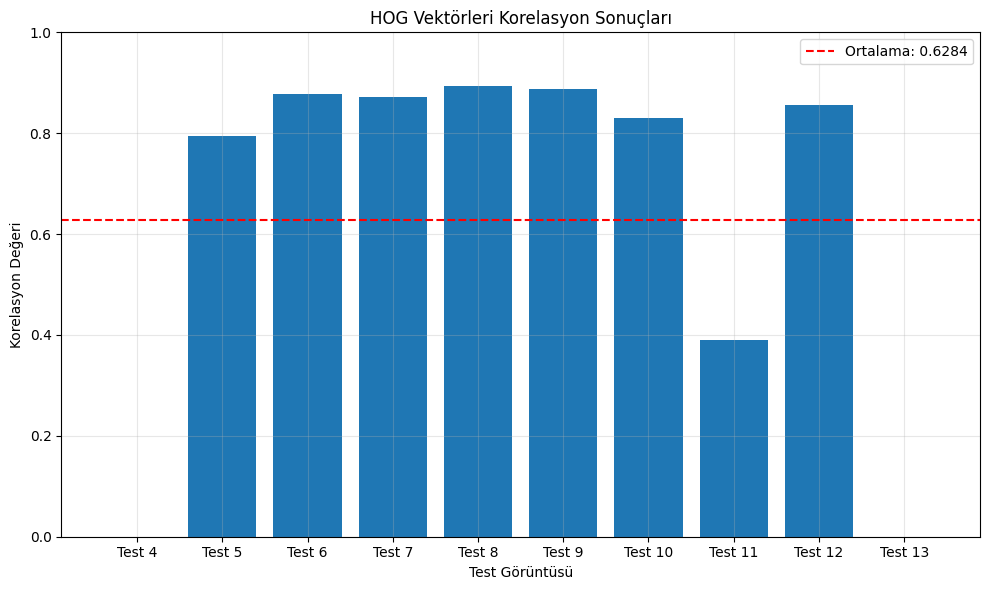


Sınıflandırma Sonuçları:
Test görüntüsü 4: Eşleşme bulunamadı (Korelasyon: -0.0872)
Test görüntüsü 5: Eşleşme bulundu (Korelasyon: 0.7946)
Test görüntüsü 6: Eşleşme bulundu (Korelasyon: 0.8768)
Test görüntüsü 7: Eşleşme bulundu (Korelasyon: 0.8724)
Test görüntüsü 8: Eşleşme bulundu (Korelasyon: 0.8932)
Test görüntüsü 9: Eşleşme bulundu (Korelasyon: 0.8870)
Test görüntüsü 10: Eşleşme bulundu (Korelasyon: 0.8301)
Test görüntüsü 11: Eşleşme bulunamadı (Korelasyon: 0.3896)
Test görüntüsü 12: Eşleşme bulundu (Korelasyon: 0.8562)
Test görüntüsü 13: Eşleşme bulunamadı (Korelasyon: -0.0283)


In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

# Sobel operatörleri ile gradyan hesaplama fonksiyonu
def compute_gradients(image):
    gx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # X yönü gradyanı
    gy = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Y yönü gradyanı

    # Gradyan büyüklüğü ve yönü
    magnitude = np.sqrt(gx**2 + gy**2)
    orientation = np.arctan2(gy, gx) * (180 / np.pi)
    orientation[orientation < 0] += 180  # 0-180 aralığına dönüştür

    return magnitude, orientation

# Her bir pikselin tanjant açısına göre gradyan ve oryantasyon toplamlarını bir vektörde toplama fonksiyonu
def compute_orientation_vectors(image, cell_size=8, bins=9):
    height, width = image.shape
    magnitude, orientation = compute_gradients(image)
    
    bin_width = 180 / bins
    hog_vector = np.zeros(bins, dtype=np.float32)  # HOG vektörü başlatma

    # Yalnızca siyah olmayan pikselleri filtreleme
    non_zero_mask = image > 0  # Siyah olmayan piksellerin maskesi

    # Oryantasyon histogramları toplama
    for y in range(0, height - cell_size + 1, cell_size):
        for x in range(0, width - cell_size + 1, cell_size):
            cell_magnitude = magnitude[y:y+cell_size, x:x+cell_size]
            cell_orientation = orientation[y:y+cell_size, x:x+cell_size]
            cell_mask = non_zero_mask[y:y+cell_size, x:x+cell_size]  # Maskeye göre filtreleme

            # Sadece siyah olmayan pikselleri kullanarak histogram hesaplama
            hist = np.zeros(bins, dtype=np.float32)
            for i in range(cell_size):
                for j in range(cell_size):
                    if cell_mask[i, j]:  # Siyah olmayan pikselleri kontrol et
                        angle = cell_orientation[i, j]
                        mag = cell_magnitude[i, j]
                        bin_idx = int(angle // bin_width)  # Hangi bin
                        bin_idx = bin_idx % bins  # Sınır kontrolü
                        hist[bin_idx] += mag  # Bine ekleme
            
            hog_vector += hist  # Histogramları birleştir
    
    return hog_vector

# Test görüntüleri için önceki önişlemeden gelen sharpened_images'ı kullan
test_image_paths = sharpened_images[0:10]  # test_image4'ten test_image13'e kadar (10 görüntü)

# Combined HOG vektörünü yükle
combined_data = np.load("combined_hog_vectors.npz")
combined_vectors = combined_data['vectors']

# Combined vektörlerin ortalamasını al
reference_vector = np.mean(combined_vectors, axis=0)

# Test görüntüleri için korelasyon sonuçları
correlation_results = []

# Her test görüntüsü için HOG hesapla ve karşılaştır
for i, test_image in enumerate(test_image_paths, start=4):
    # Test görüntüsü zaten yüklü, direkt HOG hesapla
    test_hog = compute_orientation_vectors(test_image)
    
    # Korelasyon hesapla
    correlation = 1 - cdist(reference_vector.reshape(1, -1), 
                          test_hog.reshape(1, -1), 
                          metric='correlation')[0][0]
    
    correlation_results.append(correlation)
    print(f"Test görüntüsü {i} için korelasyon: {correlation:.4f}")

# Sonuçları görselleştir
plt.figure(figsize=(10, 6))
plt.bar(range(len(correlation_results)), correlation_results)
plt.title('HOG Vektörleri Korelasyon Sonuçları')
plt.xlabel('Test Görüntüsü')
plt.ylabel('Korelasyon Değeri')
plt.xticks(range(len(correlation_results)), [f'Test {i}' for i in range(4, 4+len(correlation_results))])
plt.ylim(0, 1)
plt.grid(True, alpha=0.3)

# Ortalama korelasyonu göster
mean_correlation = np.mean(correlation_results)
plt.axhline(y=mean_correlation, color='r', linestyle='--', label=f'Ortalama: {mean_correlation:.4f}')
plt.legend()

plt.tight_layout()
plt.show()

# Eşik değeri ile sınıflandırma
threshold = 0.7  # Eşik değeri ayarlanabilir
print("\nSınıflandırma Sonuçları:")
for i, corr in enumerate(correlation_results, start=4):
    status = "Eşleşme bulundu" if corr > threshold else "Eşleşme bulunamadı"
    print(f"Test görüntüsü {i}: {status} (Korelasyon: {corr:.4f})")

IoU Hesaplama

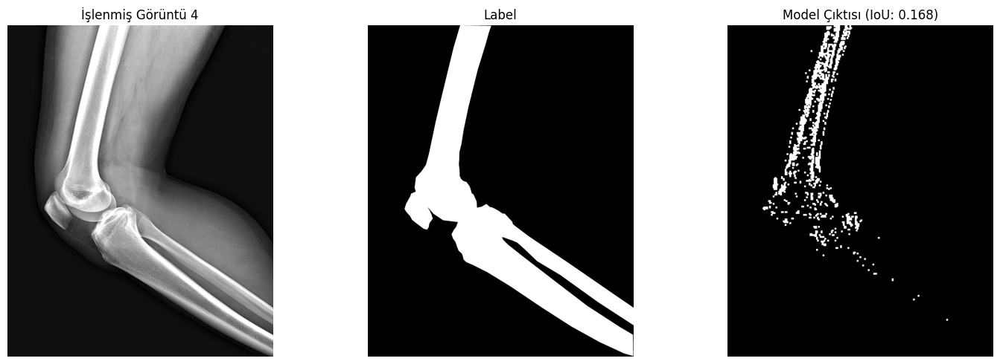

Görüntü 4 için IoU: 0.168


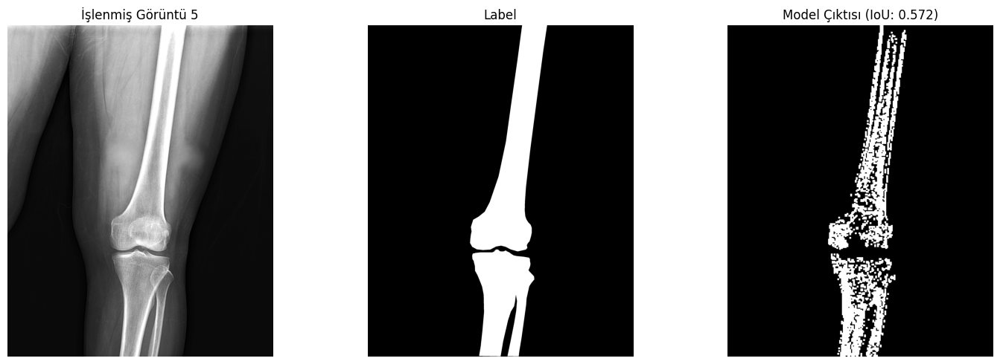

Görüntü 5 için IoU: 0.572


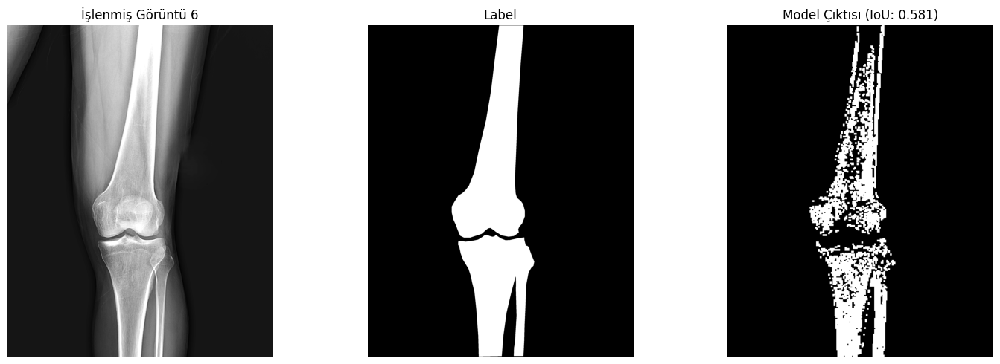

Görüntü 6 için IoU: 0.581


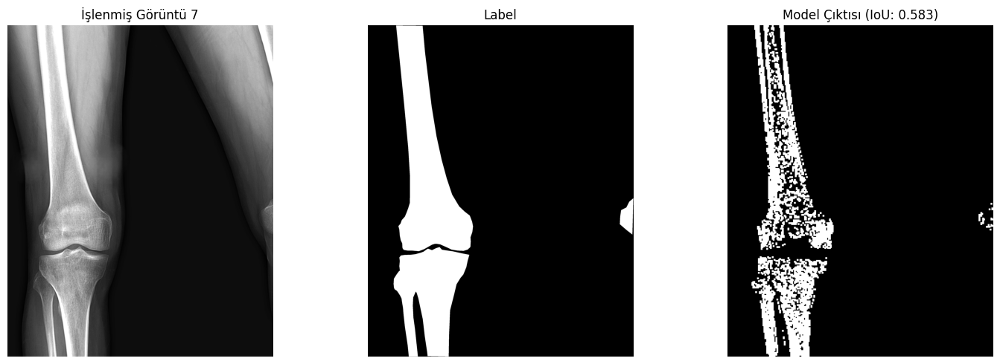

Görüntü 7 için IoU: 0.583


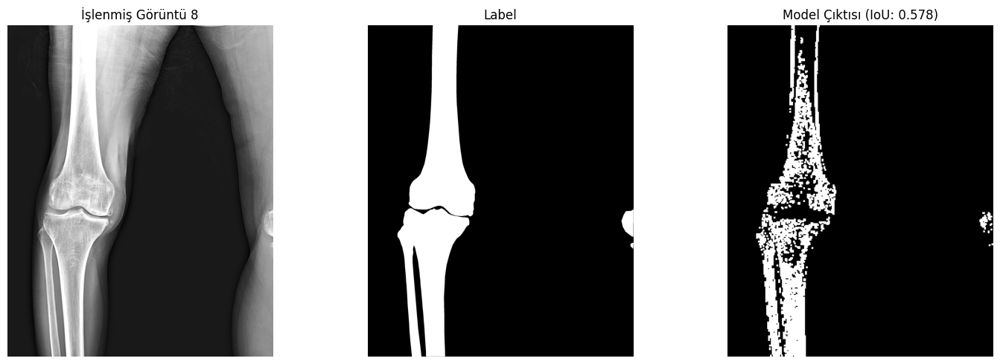

Görüntü 8 için IoU: 0.578


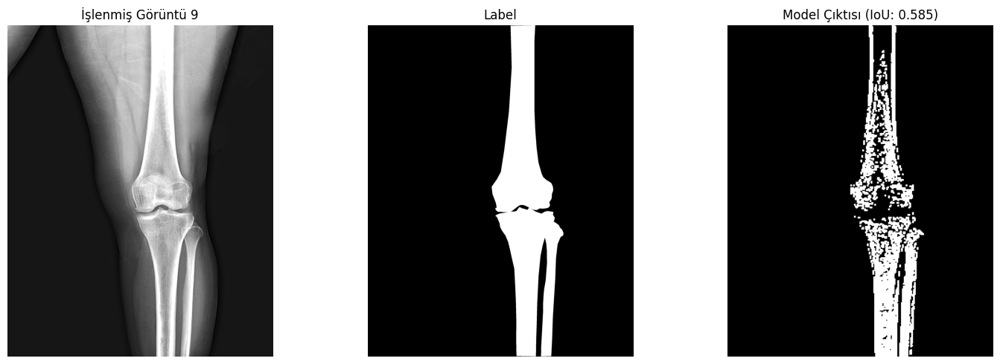

Görüntü 9 için IoU: 0.585


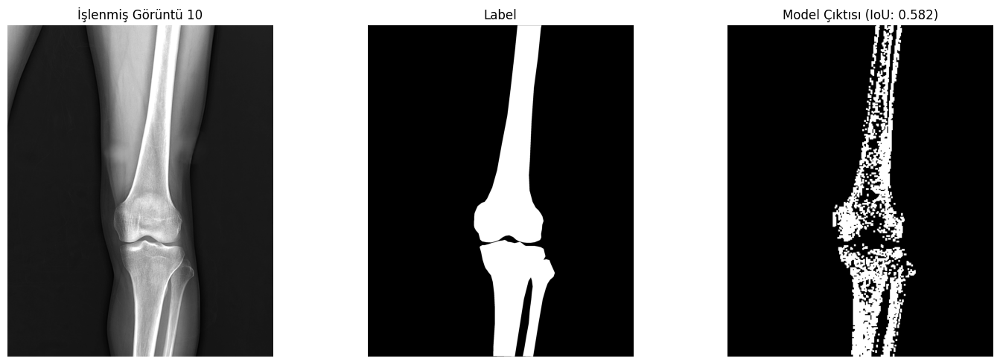

Görüntü 10 için IoU: 0.582


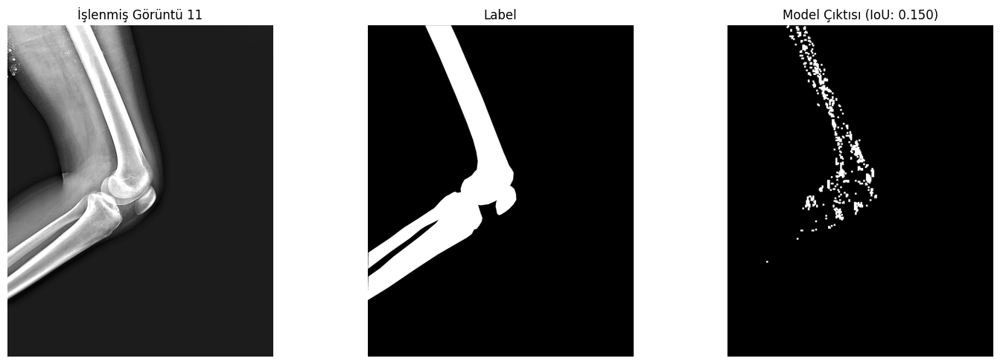

Görüntü 11 için IoU: 0.150


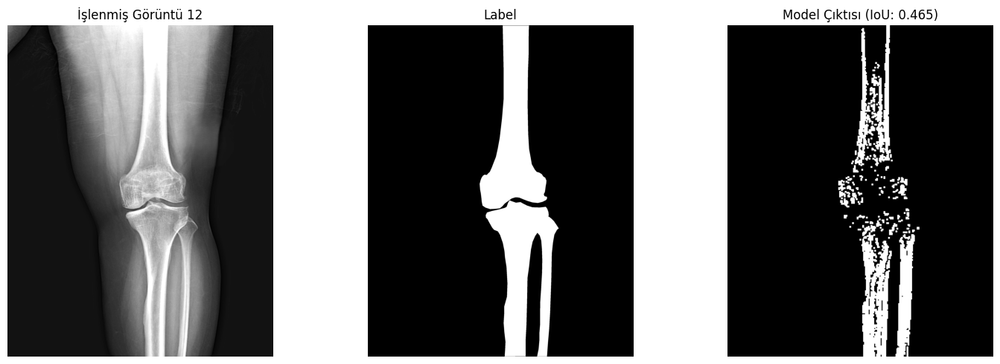

Görüntü 12 için IoU: 0.465


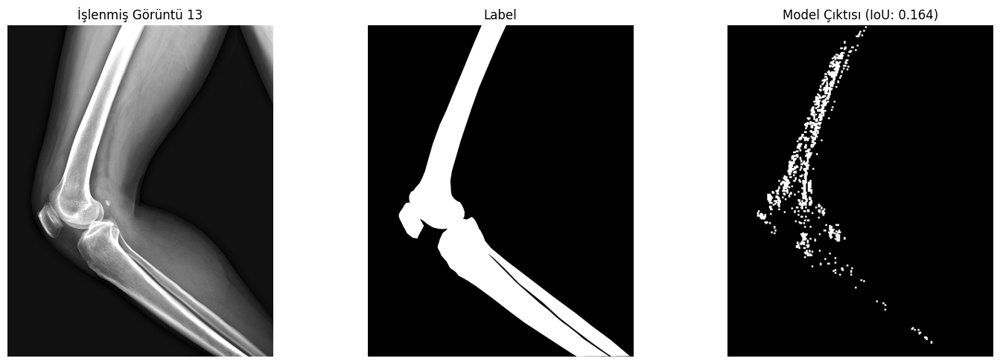

Görüntü 13 için IoU: 0.164

Ortalama IoU: nan


C:\Users\wdewe\AppData\Roaming\Python\Python38\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\wdewe\AppData\Roaming\Python\Python38\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

def compute_gradients(image):
    gx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    
    magnitude = np.sqrt(gx**2 + gy**2)
    orientation = np.arctan2(gy, gx) * (180 / np.pi)
    orientation[orientation < 0] += 180
    
    return magnitude, orientation

def compute_orientation_vectors(patch, bins=9):
    """Tek bir patch için HOG vektörü hesapla"""
    magnitude, orientation = compute_gradients(patch)
    
    bin_width = 180 / bins
    hog_vector = np.zeros(bins, dtype=np.float32)

    # Yalnızca siyah olmayan pikselleri filtreleme
    non_zero_mask = patch > 0

    # Histogram hesaplama
    for i in range(patch.shape[0]):
        for j in range(patch.shape[1]):
            if non_zero_mask[i, j]:
                angle = orientation[i, j]
                mag = magnitude[i, j]
                bin_idx = int(angle // bin_width)
                bin_idx = bin_idx % bins
                hog_vector[bin_idx] += mag

    # Normalizasyon
    if np.sum(hog_vector) != 0:
        hog_vector = hog_vector / np.sum(hog_vector)

    return hog_vector

def calculate_iou(predicted_mask, label_mask):
    """IoU (Intersection over Union) hesaplama"""
    intersection = np.logical_and(predicted_mask > 0, label_mask > 0).sum()
    union = np.logical_or(predicted_mask > 0, label_mask > 0).sum()
    if union == 0:
        return 0
    return intersection / union

# Test görüntüleri için önceki önişlemeden gelen sharpened_images'ı kullan
test_images = sharpened_images[0:10]  # test_image4'ten test_image13'e kadar
test_labels = labels[0:10]  # Karşılık gelen etiketler

# Combined HOG vektörünü yükle
combined_data = np.load("combined_hog_vectors.npz")
reference_vector = np.mean(combined_data['vectors'], axis=0)

# Test görüntüleri için korelasyon ve IoU sonuçları
correlation_results = []
iou_results = []

# Her test görüntüsü için işlem yap
for i, (test_image, label_image) in enumerate(zip(test_images, test_labels), start=4):
    # Çıktı görüntüsünü oluştur
    result_image = np.zeros_like(test_image)
    
    # Patch'ler üzerinde gezin
    patch_size = 16
    stride = 8
    
    for y in range(0, test_image.shape[0] - patch_size + 1, stride):
        for x in range(0, test_image.shape[1] - patch_size + 1, stride):
            # Patch'i al
            patch = test_image[y:y+patch_size, x:x+patch_size]
            label_patch = label_image[y:y+patch_size, x:x+patch_size]
            
            # Eğer patch'te kemik varsa işlem yap
            if np.any(label_patch > 0):
                # HOG hesapla
                patch_hog = compute_orientation_vectors(patch)
                
                # Korelasyon hesapla
                correlation = 1 - cdist(reference_vector.reshape(1, -1), 
                                     patch_hog.reshape(1, -1), 
                                     metric='correlation')[0][0]
                
                # Eğer korelasyon yüksekse işaretle
                if correlation > 0.7:
                    result_image[y:y+patch_size, x:x+patch_size] = 255
    
    # Morfolojik işlemler
    kernel = np.ones((3,3), np.uint8)
    result_image = cv2.morphologyEx(result_image, cv2.MORPH_CLOSE, kernel)
    
    # IoU hesapla
    iou_score = calculate_iou(result_image, label_image)
    
    # Sonuçları görselleştir
    plt.figure(figsize=(15, 5))
    
    plt.subplot(131)
    plt.imshow(test_image, cmap='gray')
    plt.title(f'İşlenmiş Görüntü {i}')
    plt.axis('off')
    
    plt.subplot(132)
    plt.imshow(label_image, cmap='gray')
    plt.title('Label')
    plt.axis('off')
    
    plt.subplot(133)
    plt.imshow(result_image, cmap='gray')
    plt.title(f'Model Çıktısı (IoU: {iou_score:.3f})')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Görüntü {i} için IoU: {iou_score:.3f}")

# Ortalama IoU değerini göster
mean_iou = np.mean(iou_results)
print(f"\nOrtalama IoU: {mean_iou:.3f}")